# EDA : Individual household electric power consumption Data Set


### **Integrantes:**
* André Gibert
* Ailine Morales

### **Conjunto de datos:** 
1. El conjunto de datos a utilizar es **Individual household electric power consumption**. 
2. Los datos contienen 2075259 mediciones recogidas de una casa ubicada en Sceaux (a 7 km de París, Francia) entre diciembre de 2006 y noviembre de 2010 (47 meses).
3. Se trata de mediciones del consumo de energía eléctrica en un hogar con una tasa de muestreo de un minuto durante un período de casi 4 años. Están disponibles diferentes magnitudes eléctricas y algunos valores de submedición.

### **Variables**

* **Global_active_power:** Potencia activa global promediada por minuto de la vivienda (en kilovatios).

* **Global_reactive_power:** Potencia reactiva global promediada por minuto de la vivienda (en kilovatios).

* **Voltage:** Voltaje promediado por minuto (en voltios).

* **Global_intensity:** Intensidad de corriente promediada por minuto de la vivienda (en amperios).

* **Sub_metering_1:** Sub-medición de energía N° 1 (en vatios-hora de energía activa). Corresponde a la cocina, que contiene principalmente un lavaplatos, un horno y un microondas (las placas calientes no son eléctricas, sino que funcionan con gas).

* **Sub_metering_2:** Sub-medición de energía N° 2 (en vatios-hora de energía activa). Corresponde al lavadero, que contiene una lavadora, una secadora, un refrigerador y una luz.

* **Sub_metering_3:** Sub-medición de energía N° 3 (en vatios-hora de energía activa). Corresponde a un calentador eléctrico de agua y un aire acondicionado.



### Importamos las librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calendar
from scipy.stats import shapiro
from scipy.stats import pearsonr
import scipy.stats as stats
import statistics
#import umap
from sklearn.manifold import TSNE
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import StandardScaler 
from sklearn.preprocessing import StandardScaler,MinMaxScaler
#Dividir arreglos o matrices en subconjuntos aleatorios de tren y prueba
from sklearn.model_selection import train_test_split
#Ignorar warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
#Librerías para 
from sklearn.cluster import DBSCAN
from mpl_toolkits.mplot3d import Axes3D
from prince import MCA

In [3]:
#Librerías para series temporales
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
import pmdarima as pm
from statsmodels.tsa.seasonal import seasonal_decompose

In [4]:
#Librerías para selección de características
from sklearn.feature_selection import SelectKBest, f_classif, RFE
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, mean_absolute_error

In [6]:
#Módulos implementa funciones que evalúan el error de predicción para propósitos específicos
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape
from sklearn.metrics import mean_squared_error as mse

## **Funciones**

In [7]:
def suma_mensual_columnas(df):
    años = df.index.year.unique()
    num_años = len(años)
    num_columnas = len(df.columns)

    fig, axs = plt.subplots(num_columnas, num_años, figsize=(15, 5*num_columnas))

    for j, col in enumerate(df.columns):
        for i, year in enumerate(años):
            df_i = df.loc[df.index.year == year]

            # Calcular la suma mensual de la columna correspondiente para el año i
            suma_mensual_i = df_i.groupby(df_i.index.month)[col].sum()

            # Generar el gráfico de barras en el subplot correspondiente
            ax = axs[j, i ]  # Ajustar el índice del subplot
            ax.bar(suma_mensual_i.index, suma_mensual_i, edgecolor='black')

            # Etiquetas y título
            ax.set_xlabel('Mes', fontsize=12)
            ax.set_ylabel(f'Suma {col}', fontsize=12)
            ax.set_title(f'{col} por Mes ({year})', fontsize=14)

            # Ajustar los ticks del eje x con los nombres de los meses
            ax.set_xticks(suma_mensual_i.index)
            ax.set_xticklabels([calendar.month_name[j] for j in suma_mensual_i.index], rotation=45, ha='right')

            # Añadir una rejilla horizontal para facilitar la lectura de los valores
            ax.grid(axis='y', linestyle='--')

    # Ajustar los espacios entre los subplots
    plt.tight_layout()

    # Mostrar la figura con los gráficos
    plt.show()

In [8]:
def promedio_mensual_columnas(df):
    años = df.index.year.unique()
    num_años = len(años)
    num_columnas = len(df.columns)

    fig, axs = plt.subplots(num_columnas, num_años, figsize=(15, 5*num_columnas))
    
    for j, col in enumerate(df.columns):
        for i, year in enumerate(años):
            df_i = df.loc[df.index.year == year]

            # Calculamos el promedio mensual de la columna correspondiente para el año i
            promedio_mensual_i = df_i.groupby(df_i.index.month)[col].mean()

            # Generar el gráfico de barras en el subplot correspondiente
            ax = axs[j, i]  # Ajustar el índice del subplot
            ax.bar(promedio_mensual_i.index, promedio_mensual_i, color='purple', edgecolor='black')

            # Etiquetas y título
            ax.set_xlabel('Mes', fontsize=12)
            ax.set_ylabel(f'Promedio {col}', fontsize=12)
            ax.set_title(f' {col} por Mes ({year})', fontsize=14)

            # Ajustar los ticks del eje x con los nombres de los meses
            ax.set_xticks(promedio_mensual_i.index)
            ax.set_xticklabels([calendar.month_name[j] for j in promedio_mensual_i.index], rotation=45, ha='right')

            # Añadir una rejilla horizontal para facilitar la lectura de los valores
            ax.grid(axis='y', linestyle='--')

    # Ajustar los espacios entre los subplots
    plt.tight_layout()

    # Mostrar la figura con los gráficos
    plt.show()

In [9]:
def barra_año(df):
    for col in df.columns:
        ax = df[col].groupby(df[col].index.year).sum().plot(kind="bar", width=0.4, xlabel='Año', ylabel=col, title=col + " total anual",figsize=(10, 3), edgecolor='black')
        ax.grid(axis='y', which='major', linestyle='--')
        plt.show()

In [10]:
def barra_promedio_año(df):
    for col in df.columns:
        ax = df[col].groupby(df[col].index.year).mean().plot(kind="bar", width=0.4, xlabel='Año', ylabel=col, title=col + " promedio anual", color = 'purple', figsize=(10, 3), edgecolor='black')
        ax.grid(axis='y', which='major', linestyle='--')
        plt.show()

In [11]:
def histograma_columnas(df):
    num_columnas = len(df.columns)
    fig, axs = plt.subplots(num_columnas, figsize=(10, 3*num_columnas))

    for i, col in enumerate(df.columns):
        ax = axs[i]
        data = df[col]

        ax.hist(data, bins=70, edgecolor='black', density=True, color = 'skyblue')
        ax.set_xlabel(col)
        ax.set_ylabel('Frecuencia')
        ax.set_title(f'Histograma de {col}')
        
        # Añadir una rejilla horizontal para facilitar la lectura de los valores
        ax.grid(axis='y', linestyle='--')

        sns.kdeplot(data, ax=ax, color='darkblue', linewidth=2)

    plt.tight_layout()
    plt.show()

In [12]:
def analisis(df):
    for col in df.columns:
        datanan = df[[col]].dropna()
        if np.count_nonzero(datanan) != 0:
            # Cálculo de los Q1 y Q3, para el rango intercuartílico
            Q1 = datanan[col].quantile(0.25)
            Q3 = datanan[col].quantile(0.75)
            dic = Q3 - Q1  # Rango intercuartílico
            data = df[[col]]
            inf = Q1 - dic * 3
            sup = Q3 + dic * 3

            # Condiciones
            cond1 = data[col] > inf
            cond2 = data[col] < sup
            cond3 = (data[col] <= sup) & (data[col] >= inf) & (data[col] > 0)

            y1 = data[col][cond1]
            y2 = data[col][cond2]
            y3 = data[col][cond3]

            x1 = y1.index
            x2 = y2.index
            x3 = y3.index

            cuenta = data[col].count()
            prom = data[col].mean()
            std = data[col].std()
            minimo = data[col].min()
            maximo = data[col].max()
            nas = data[col].isna().sum()
            nas_percent = 100 * (nas / len(data[col]))
            ceros = (data[col] == 0).sum()
            ceros_percent = 100 * (ceros / len(data[col]))
            noceros = (data[col] != 0).sum()
            noceros_percent = 100 * (noceros / len(data[col]))
            cota_sup = (data[col] > sup).sum()
            cota_inf = (data[col] < inf).sum()
            outliers_percent = 100 * ((cota_sup + cota_inf) / len(data[col]))

            fig, ax = plt.subplots(figsize=(12, 6))
            ax.plot(x1, y1, 'k.', x2, y2, 'r.', x3, y3, 'k.')
            ax.plot(x1, y1, 'k.', x2, y2, 'k.', x3, y3, 'k.')
            ax.axhline(y=inf, color='red')
            ax.axhline(y=max(Q1 - dic * 3, 0), color='red')
            ax.axhline(y=sup, color='red')
            ax.set_xlabel('Fecha')
            ax.set_ylabel(col)
            ax.grid(True)
            plt.show()

            print(f'La desviación estándar de la variable {col} es {round(std, 2)}')
            print(f'El promedio de la variable {col} es {round(prom, 2)}')
            print(f'El máximo de la variable {col} es {round(maximo, 2)}')
            print(f'El mínimo de la variable {col} es {round(minimo, 2)}')
            print(f'El porcentaje de outliers de la variable {col} es {round(outliers_percent, 2)}')
        else:
            print("No se puede")

In [13]:
def tsne_plot(df, n_components):
    # Creamos una instancia t-SNE
    tsne = TSNE(random_state=42, n_components=n_components)
    X_tsne = tsne.fit_transform(df)

    # Calcula la matriz de covarianza
    cov_matrix = np.cov(X_tsne.T)

    # Calcula los eigenvectores y eigenvalores
    eigenvalues, eigenvectors = np.linalg.eig(cov_matrix)

    # Calcula el porcentaje de varianza explicado por cada componente
    explained_variance_ratio = eigenvalues / np.sum(eigenvalues)

    # Imprime los componentes y el porcentaje de varianza
    print("Componente\tPorcentaje de Varianza")
    for i, variance in enumerate(explained_variance_ratio):
        print("Componente {}:\t{:.2%}".format(i+1, variance))

    # Creamos una figura
    fig = plt.figure(figsize=(8, 8))

    # Graficamos el resultado
    if n_components == 2:
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1])
        plt.xlabel('Componente 1')
        plt.ylabel('Componente 2')
    elif n_components == 3:
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2])
        ax.set_xlabel('Componente 1')
        ax.set_ylabel('Componente 2')
        ax.set_zlabel('Componente 3')
        ax.set_title('Gráfico t-SNE')

    plt.show()

In [14]:
def kernel_pca(df, n_components):
    # Obtener las características del dataframe
    X = df.values
    
    # Realizar Kernel PCA
    kpca = KernelPCA(n_components=n_components)
    components = kpca.fit_transform(X)
    
    # Calcular la varianza total
    total_variance = np.sum(np.var(X, axis=0))
    
    # Calcular la varianza explicada
    explained_variance_ratio = np.var(components, axis=0) / total_variance
    explained_variance_ratio_sum = np.sum(explained_variance_ratio)
    
    # Ajustar el porcentaje de varianza explicada para sumar 100%
    remaining_variance = 1.0 - explained_variance_ratio_sum
    explained_variance_ratio_adjusted = explained_variance_ratio + (remaining_variance / n_components)
    
    # Crear un nuevo dataframe con los componentes principales
    column_names = [f'Componente {i+1}' for i in range(n_components)]
    components_df = pd.DataFrame(data=components, columns=column_names)
    
    # Crear una tabla con el porcentaje de varianza explicada
    variance_table = pd.DataFrame({
        'Componente': column_names,
        'Porcentaje de Varianza': explained_variance_ratio_adjusted * 100
    })
    
    print(variance_table)
    
    # Graficar las componentes principales
    if n_components == 2:
        plt.figure(figsize=(6, 4))
        plt.scatter(components[:, 0], components[:, 1])
        plt.xlabel('Componente 1')
        plt.ylabel('Componente 2')
        plt.title('Componentes Principales')
        plt.show()
    elif n_components == 3:
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(components[:, 0], components[:, 1], components[:, 2])
        ax.set_xlabel('Componente 1')
        ax.set_ylabel('Componente 2')
        ax.set_zlabel('Componente 3')
        ax.set_title('Gráfico Kernel PCA')
        plt.show()
    
    return explained_variance_ratio_adjusted

In [15]:
def mca(df, num_components):
    # Realizar el Análisis de Correspondencia Múltiple (ACM)
    mca = MCA(n_components=num_components)
    mca.fit(df)

    # Obtener las coordenadas de las categorías en el espacio reducido
    coordinates = mca.transform(df)

    if num_components == 2:
        # Graficar en un gráfico de dispersión bidimensional
        plt.figure(figsize=(6, 4))
        plt.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], alpha=0.5)
        plt.xlabel(f"Componente 1")
        plt.ylabel(f"Componente 2")
        plt.title("Gráfico de Dispersión MCA")
        plt.grid(True)
        plt.show()

    elif num_components == 3:
        # Graficar en un gráfico de dispersión tridimensional
        fig = plt.figure(figsize=(8, 6))
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(coordinates.iloc[:, 0], coordinates.iloc[:, 1], coordinates.iloc[:, 2], alpha=0.5)
        ax.set_xlabel(f"Componente 1")
        ax.set_ylabel(f"Componente 2")
        ax.set_zlabel(f"Componente 3")
        ax.set_title("Gráfico de Dispersión MCA")
        plt.show()

    else:
        print("El número de componentes debe ser 2 o 3.")

    # Calcular el porcentaje de varianza explicada manualmente
    eigenvalues = mca.eigenvalues_
    total_variance = eigenvalues.sum()
    explained_variance = eigenvalues / total_variance * 100

    # Imprimir el porcentaje de varianza explicada por cada componente
    for i, variance in enumerate(explained_variance):
        print(f"Componente {i+1}: {variance:.2f}% de varianza explicada")

In [16]:
#Test de normalidad con 1-alpha porcentaje de confianza.
#Recibe una muestra de datos y el porcentaje de significancia alpha.
def shapiro_test(df,alpha):
    for col in df.columns:
        stat, pvalue = shapiro(df[col])
        if pvalue > alpha:
	        print('Podemos concluir que la variable ' + col + ' se distribuye normalmente con un ',round((1-alpha)*100),'% de confianza')
        else:
            print('Podemos concluir que la variable ' + col + ' no se distribuye normalmente con un ',round((1-alpha)*100),'% de confianza')
    

In [17]:
def test_independencia(df,alpha):
    for col1 in df.columns:
        x = df[col1]
        for col2 in df.columns:
            y = df[col2]
        if col1 != col2:
            corr, p_value = pearsonr(x, y)
            print(f"\nColumnas: {col1} y {col2}")           
            if p_value < alpha:
                print("Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.")
            else:
                print("No se puede rechazar la hipótesis nula. No hay suficiente evidencia para concluir que las variables están relacionadas.")

In [18]:
#Test de homogeneidad
def homogeneidad():
    # Realizar el test de ANOVA
    statistic, p_value = stats.f_oneway(grupo1, grupo2, grupo3)
    # Imprimir los resultados
    print("Estadístico de prueba:", statistic)
    print("Valor p:", p_value)

In [19]:
#Test de estacionaridad
def Augmented_Dickey_Fuller(serie_temporal):
    result = adfuller(serie_temporal)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    if result[1] < 0.05:
        print('Se rechaza la hipótesis nula, por lo tanto la serie temporal es estacionaria con un 0.05 nivel de significancia')
    else:
        print('No hay suficiente evidencia estadística para rechazar la hipótesis nula, por lo tanto la serie temporal no es estacionaria con un 0.05 nivel de significancia')

In [20]:
def diag_caja(df):
    for col in df.columns:
        plt.boxplot(df[col])
        plt.xlabel(col)
        plt.ylabel('Valores')
        plt.title('Diagrama de Caja')
        plt.show()

In [21]:
#No se usará
def transform_time_series_to_structured_data(time_series_data, exogenous_data, window_size):
    # Crear una lista vacía para almacenar los datos estructurados
    structured_data = []

    # Obtener el número total de muestras
    total_samples = len(time_series_data)

    # Iterar a través de la serie de tiempo para crear las muestras estructuradas
    for i in range(total_samples - window_size):
        # Obtener la ventana de tiempo actual de la serie de tiempo
        window_time_series = time_series_data[i:i+window_size]

        # Obtener las variables exógenas correspondientes a la ventana de tiempo
        window_exogenous_data = exogenous_data[i:i+window_size]

        # Obtener la variable endógena (la siguiente muestra en la serie de tiempo)
        target = time_series_data[i+window_size]

        # Crear un diccionario para almacenar la muestra estructurada
        structured_sample = {}

        # Agregar la ventana de tiempo de la serie de tiempo como características
        for j, value in enumerate(window_time_series):
            structured_sample[f'time_series_feature_{j+1}'] = value

        # Agregar las variables exógenas como características
        for j, value in enumerate(window_exogenous_data):
            structured_sample[f'exogenous_feature_{j+1}'] = value

        # Agregar la variable endógena
        structured_sample['target'] = target

        # Agregar la muestra estructurada a la lista
        structured_data.append(structured_sample)

    # Crear un DataFrame a partir de los datos estructurados
    structured_df = pd.DataFrame(structured_data)

    return structured_df

In [22]:
def time_delay_embedding(series: pd.Series, n_lags: int, horizon: int):
    """
    Incrustación de retardo de tiempo
    :param series: serie de tiempo como objeto de pandas
    :param n_lags: número de valores pasados para usar como variables explicativas
    :param horizon: horizonte de pronostico
    :return:pd.DataFrame con series temporales reconstruidas
    """
    assert isinstance(series, pd.Series)

    if series.name is None:
        name = 'Series'
    else:
        name = series.name

    n_lags_iter = list(range(n_lags, -horizon, -1))

    serie_time_delay = [series.shift(i) for i in n_lags_iter]
    serie_time_delay = pd.concat(serie_time_delay, axis=1).dropna()
    serie_time_delay.columns = [f'{name}(t-{j - 1})'
                 if j > 0 else f'{name}(t+{np.abs(j) + 1})'
                 for j in n_lags_iter]

    return serie_time_delay

In [23]:
# Función para generar las particiones preservando las características
# de la serie de tiempo

def Train_val_test_split(dataframe, tr_size=0.7, vl_size=0.15, ts_size=0.15 ):
    # Definir número de datos en cada subserie
    N = dataframe.shape[0]
    Ntrain = int(tr_size*N)  # Número de datos de entrenamiento
    Nval = int(vl_size*N)    # Número de datos de validación
    Ntst = N - Ntrain - Nval # Número de datos de prueba

    # Realizar partición
    train = dataframe[0:Ntrain]
    val = dataframe[Ntrain:Ntrain+Nval]
    test = dataframe[Ntrain+Nval:]

    return train, val, test

In [24]:
def serie_split(df,n,m):
    serie_split = []
    for columna in df:
        col_df = time_delay_embedding(
        df[columna], #Serie de tiempo
        n_lags=n, #Numero de retrasos
        horizon=m # Horizonte de prediccion
        )
        serie_split.append(col_df)
    df = pd.concat(serie_split, axis=1).dropna()
    return df    

In [25]:
def estandarización(df):
    #Se define escalado
    std_scaler = StandardScaler()
    min_scaler=MinMaxScaler()

    #Transformacion

    for i in df.columns:
        df[i] = min_scaler.fit_transform(df[i].values.reshape(-1,1))

    return df

In [26]:
def outliers_DBSCAN(df, eps, min_samples):
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(df)
    etiquetas = dbscan.labels_
    outliers_indices = np.where(etiquetas == -1)[0]
    outliers = df.iloc[outliers_indices]
    return outliers

def combinaciones(df):
    resultados = pd.DataFrame(index=range(2, 11), columns=np.arange(0.1, 1.1, 0.1))
    combinaciones = []  # Lista para almacenar las combinaciones

    fig, axs = plt.subplots(9, 10, figsize=(40, 30))  # Crear subplots (9 filas x 10 columnas)
    fig.subplots_adjust(hspace=0.2, wspace=0.1)  # Ajustar espaciado vertical entre subplots (increase hspace)

    for row, min_samples in enumerate(range(2, 11)):  # Iterar por filas (valores de min_samples)
        for col, eps in enumerate(np.arange(0.1, 1.1, 0.1)):  # Iterar por columnas (valores de eps)
            outliers = outliers_DBSCAN(df, eps, min_samples)
            resultados.at[min_samples, eps] = len(outliers)

            if len(outliers) > 0:  # Comprueba si hay outliers
                combinaciones.append((round(eps, 1), min_samples))
                # Grafica los resultados de DBSCAN con la combinación actual en el subplot correspondiente
                dbscan = DBSCAN(eps=eps, min_samples=min_samples)
                labels = dbscan.fit_predict(df)
                axs[row, col].scatter(df.iloc[:, 0], df.iloc[:, 1], c=labels, cmap='viridis', s=12)
                axs[row, col].scatter(outliers.iloc[:, 0], outliers.iloc[:, 1], c='red', marker='x', s=20)
                axs[row, col].set_title(f'eps = {round(eps, 1)}, min_samples = {round(min_samples)}')
            else:
                # Si no hay outliers, eliminar el subplot correspondiente
                fig.delaxes(axs[row, col])

            # Control visibility of axis labels
            if row == 8:
                axs[row, col].set_xlabel('eje X')
            else:
                axs[row, col].set_xticklabels([])
            if col == 0:
                axs[row, col].set_ylabel('eje Y')
            else:
                axs[row, col].set_yticklabels([])

    valor_minimo = resultados.min().min()
    valor_maximo = resultados.max().max()
    valor_moda = statistics.mode(resultados.stack())

    fila_minima = resultados[resultados == valor_minimo].stack().index[0][0]
    columna_minima = resultados[resultados == valor_minimo].stack().index[0][1]

    fila_maxima = resultados[resultados == valor_maximo].stack().index[0][0]
    columna_maxima = resultados[resultados == valor_maximo].stack().index[0][1]

    print(f"El valor mínimo es {valor_minimo}, su eps es {columna_minima} y su min_samples es {fila_minima}")
    print(f"El valor máximo es {valor_maximo}, su eps es {columna_maxima} y su min_samples es {fila_maxima}")

    print(f"El valor que más se repite es {valor_moda} y se encuentra en las combinaciones de eps y num_samples:")
    print(f"{combinaciones}")

    print(' ')
    return resultados
    plt.show()  # Mostrar los subplots

def interpolate_outliers(df, eps, min_samples, method):
    # Escalamos los datos para que tengan un rango [0, 1]
    df_escalado = pd.DataFrame(MinMaxScaler().fit_transform(df), columns=df.columns)
    # Detectamos los outliers usando DBSCAN
    outliers = DBSCAN(eps=eps, min_samples=min_samples).fit_predict(df_escalado) == -1
    # Hacemos una copia del DataFrame original para hacer las interpolaciones
    df_interpolated = df.copy()
    # Llenar filas con outliers con NaN
    df_interpolated[outliers] = np.nan
    # Interpolación lineal
    df_interpolated.interpolate(method= method, inplace=True)
    
    return df_interpolated

In [27]:
def combinaciones_con_outliers(df):
    combinaciones_con_outliers = []  # Lista para almacenar las combinaciones con outliers
    cantidades_previas = set()  # Conjunto para almacenar las cantidades de outliers previamente vistas

    for min_samples in range(2, 11):  # Iterar por valores de min_samples
        for eps in np.arange(0.1, 1.1, 0.1):  # Iterar por valores de eps
            outliers = outliers_DBSCAN(df, eps, min_samples)
            num_outliers = len(outliers)

            if num_outliers > 0 and num_outliers not in cantidades_previas:  # Comprueba si hay outliers y si no se ha visto antes
                combinaciones_con_outliers.append((round(eps, 1), min_samples,num_outliers))
                cantidades_previas.add(num_outliers)

    return combinaciones_con_outliers

In [28]:
def root_mean_squared_error(y_true, y_pred):
    rmse = tf.math.sqrt(tf.math.reduce_mean(tf.square(y_pred-y_true)))
    return rmse

In [29]:
def predecir(x, model, scaler):
    # Calcular predicción escalada en el rango de -1 a 1
    y_pred = model.predict(x,verbose=0)

    # Llevar la predicción a la escala original
    y_pred = scaler.inverse_transform(y_pred)

    return y_pred.flatten()

In [30]:
def calcular_metricas(predicciones, valores_reales):
    # Cálculo del Error Cuadrático Medio (MSE)
    mse = mean_squared_error(valores_reales, predicciones)

    # Cálculo del Error Absoluto Medio (MAE)
    mae = mean_absolute_error(valores_reales, predicciones)

    # Cálculo del RMSE (Raíz del Error Cuadrático Medio)
    rmse = np.sqrt(mse)

    return mse, rmse, mae

In [31]:
def crear_dataset_supervisado_LSTM(datos, input_lenght, output_lenght):
    '''
    Parámetros:
    -datos: Arreglo numpy de tamaño n x features (n:cantidad de datos, features: cantidad de features)
    -input_lenght: instantes de tiempo consecutivos de la(s) serie(s) de tiempo usados para alimentar el modelo
    -output_lenght: instantes de tiempo a pronosticar (salida del modelo)
    '''
    X,Y = [],[]
    shape = datos.shape
    if len(shape)==1: #Caso univariado
        fils, cols = datos.shape[0],1
        datos = datos.reshape(fils,cols)
    else: #Caso multivariado
        fils,cols = datos.shape

    #Generar los arreglos
    for i in range(fils-input_lenght-output_lenght):
        X.append(datos[i:i+input_lenght,0:cols])
        Y.append(datos[i+input_lenght:i+input_lenght+output_lenght,0].reshape(output_lenght,1))

    X = np.array(X)
    Y = np.array(Y)    
        
    return X,Y

**Forma 1: Redes neuronales**

In [32]:
def train_val_test_split(pred,target, tr_size=0.7, vl_size=0.15, ts_size=0.15 ):
    # Definir número de datos en cada subserie
    N = pred.shape[0]
    Ntrain = int(tr_size*N)  # Número de datos de entrenamiento
    Nval = int(vl_size*N)    # Número de datos de validación
    Ntst = N - Ntrain - Nval # Número de datos de prueba

    # Realizar partición
    x_train = pred[0:Ntrain]
    x_val = pred[Ntrain:Ntrain+Nval]
    x_test = pred[Ntrain+Nval:]

    y_train = target[0:Ntrain]
    y_val = target[Ntrain:Ntrain+Nval]
    y_test = target[Ntrain+Nval:]

    return x_train, x_val, x_test,y_train, y_val, y_test

In [33]:
def tensor_format(x_train, x_val, x_test,y_train, y_val, y_test):
    #Se da formato de entradas como: Un tensor 3D con la forma [batch, timesteps, feature]
    x_train=np.array(x_train)
    x_train = x_train.reshape((x_train.shape[0], 1, x_train.shape[1]))

    y_train=np.array(y_train)
    y_train = y_train.reshape((y_train.shape[0], 1, y_train.shape[1]))

    x_test=np.array(x_test)
    x_test = x_test.reshape((x_test.shape[0], 1, x_test.shape[1]))

    y_test=np.array(y_test)
    y_test = y_test.reshape((y_test.shape[0], 1, y_test.shape[1]))

    x_val=np.array(x_val)
    x_val = x_val.reshape((x_val.shape[0], 1, x_val.shape[1]))

    y_val=np.array(y_val)
    y_val = y_val.reshape((y_val.shape[0], 1, y_val.shape[1]))

    return x_train, x_val, x_test,y_train, y_val, y_test

**Forma 2: Redes neuronales**

In [34]:
# Función para generar las particiones preservando las características
# de la serie de tiempo

def Train_test_split(dataframe, tr_size=0.75, ts_size=0.25):
    # Definir número de datos en cada subserie
    N = dataframe.shape[0]
    Ntrain = int(tr_size*N)  # Número de datos de entrenamiento
    Ntst = N - Ntrain  # Número de datos de prueba

    # Realizar partición
    train = dataframe[0:Ntrain]
    test = dataframe[Ntrain:]
    

    return train,test

In [35]:
def model_LSTM(neurons,layers,learning_rate): # Crear el modelo LSTM
  # Longitud_entrada: Cantidad de columnas de X_train
  # Longitud_salidLongitud_entradaa:  Cantidad de columnas de y_train
  model = Sequential()
  model.add(LSTM(units=neurons,return_sequences=(layers-1),input_shape = (7,x_train_lstm.shape[2])))
  model.add(Dense(units=1))
  model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mse',metrics=[tf.keras.metrics.MeanSquaredError(),
                                                                                tf.keras.metrics.RootMeanSquaredError(),
                                                                                tf.keras.metrics.MeanAbsoluteError(),
                                                                                tf.keras.metrics.MeanAbsolutePercentageError()]) # Compilación del modelo
  return(model)

In [36]:
def objective(params):
  epochs = int(params["epochs"])
  batch_size = int(params['batch_size'])
  neurons = int(params["n_units"])
  learning_rate = float(params["learning_rate"])
  layers = int(params['layers'])

  models = []
  scores = []
  times=[]

  model = model_LSTM(neurons,layers,learning_rate)

  #kf = KFold(n_splits=5)
  tscv = TimeSeriesSplit(n_splits=5)
  scores = []
  times=[]
  models=[]

  #Validacion cruzada
  for train_index, val_index in tscv.split(x_train_lstm):
        
    x_train_lstm_, x_val_lstm_ = x_train_lstm[train_index], x_train_lstm[val_index]
    y_train_lstm_, y_val_lstm_ = y_train[train_index], y_train[val_index]

    #Entrenamiento
    start = time.time()
    hist=model.fit(x_train_lstm_, y_train_lstm_, batch_size=int(batch_size), epochs=int(epochs), verbose=0, validation_data=(x_val_lstm_, y_val_lstm_))
    end = time.time()

    #Evaluacion del modelo
    score = model.evaluate(x_val_lstm_, y_val_lstm_, verbose = 0)
    scores.append(score)

    #guardar modelo keras
    models.append(model)

    #Tiempo de la validadion cruzada
    time_val= end- start
    times.append(time_val)
  return{'loss':np.mean(scores),
         'status':STATUS_OK,
         'model':model,
         'hist':hist,
         'models':models,
         'scores':scores,
         'times':times}


### Cargamos la data en un dataframe

In [37]:
df = pd.read_csv('household_power_consumption.txt', sep=';',
                  parse_dates={'dt' : ['Date', 'Time']}, infer_datetime_format=True, 
                 low_memory=False, na_values=['nan','?'],index_col='dt')

**parse_dates** es un argumento que se utiliza para indicar qué columnas del DataFrame contienen fechas y/o tiempos que deben analizarse y convertirse en objetos de fecha y hora de pandas. En este caso, se indica que las columnas 'Date' y 'Time' deben combinarse y analizarse juntas como una sola columna llamada 'dt'.

**infer_datetime_format** es un argumento que se utiliza para indicar a pandas que intente inferir el formato de fecha y hora automáticamente en lugar de requerir que se especifique manualmente. Esto puede ser útil si el formato de fecha y hora varía de una fila a otra en el DataFrame.

**low_memory** se establece en False para evitar que pandas tenga que analizar el archivo de texto dos veces para determinar los tipos de datos de cada columna.

**na_values** se utiliza para indicar a pandas que los valores 'nan' y '?' en el archivo de texto deben ser tratados como valores nulos (NaN) de pandas.

**index_col** indica que la columna 'dt' debe utilizarse como índice para el DataFrame resultante.

In [38]:
# Contabilizamos las filas y columnas
df.shape

(2075259, 7)

En total hay 2075259 observaciones o filas y 8 características o columnas, pero después de convertir la columna Fecha como índice, el número de columnas restantes es 7.

In [39]:
#Visualizamos las primeras 5 filas
df.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [40]:
#Visualizamos las últimas 5 filas
df.tail()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2010-11-26 20:58:00,0.946,0.0,240.43,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.0,240.00,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.0,239.82,3.8,0.0,0.0,0.0
2010-11-26 21:01:00,0.934,0.0,239.70,3.8,0.0,0.0,0.0
2010-11-26 21:02:00,0.932,0.0,239.55,3.8,0.0,0.0,0.0


### Análisis de datos nulos

In [41]:
cantidad_nulos = df.isnull().sum()
porcentaje_nulos = round((cantidad_nulos / len(df)) * 100,3)
resultados = pd.concat([cantidad_nulos, porcentaje_nulos], axis=1, keys=['Cantidad Nulos', 'Porcentaje Nulos'])
resultados['Porcentaje Nulos'] = resultados['Porcentaje Nulos'].astype(str) + '%'
resultados

,Cantidad Nulos,Porcentaje Nulos
Global_active_power,25979,1.252%
Global_reactive_power,25979,1.252%
Voltage,25979,1.252%
Global_intensity,25979,1.252%
Sub_metering_1,25979,1.252%
Sub_metering_2,25979,1.252%
Sub_metering_3,25979,1.252%


**El conjunto de datos contiene aproximadamente 1,25% de valores faltantes en las mediciones** 

In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2075259 entries, 2006-12-16 17:24:00 to 2010-11-26 21:02:00
Data columns (total 7 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   Global_active_power    float64
 1   Global_reactive_power  float64
 2   Voltage                float64
 3   Global_intensity       float64
 4   Sub_metering_1         float64
 5   Sub_metering_2         float64
 6   Sub_metering_3         float64
dtypes: float64(7)
memory usage: 126.7 MB


### **Estadística Descriptiva**

Visualizamos la estadística descriptiva pre limpieza de los datos nulos.

In [43]:
df.describe().round(3).iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.092,0.124,240.84,4.628,1.122,1.299,6.458
std,1.057,0.113,3.24,4.444,6.153,5.822,8.437


### **Limpieza de nulos**

Analizaremos 3 formas de realizar la imputación de datos nulos y se elegirá la que conserve de mejor manera los valores del resumen estadístico antes de las imputaciones.

**Primera forma:** Forward fill

In [44]:
#Llenar los valores faltantes (NaN) hacia adelante (forward fill) 
df.ffill().describe().round(3).iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.086,0.123,240.842,4.604,1.111,1.288,6.417
std,1.053,0.113,3.236,4.427,6.116,5.787,8.420


**Segunda forma:** Backward fill

In [45]:
#Llenar los valores faltantes (NaN) hacia atrás (backward fill)
df.bfill().describe().round(3).iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.094,0.124,240.824,4.639,1.108,1.291,6.468
std,1.055,0.113,3.251,4.434,6.116,5.787,8.456


**Tercera forma: Promedio de Forward y Backward fill**

In [46]:
#LLenar los valores faltantes (NaN) con el promedio del valor anterior y el siguiente
((df.ffill() + df.bfill()) / 2).describe().round(3).iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.090,0.124,240.833,4.621,1.109,1.289,6.442
std,1.052,0.112,3.235,4.421,6.116,5.786,8.405


**Cuarta forma: Interpolación**

In [47]:
df.interpolate(method='time').describe().round(3).iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.090,0.124,240.833,4.621,1.109,1.289,6.442
std,1.053,0.112,3.238,4.424,6.116,5.787,8.416


**Dado que el método de interpolación es específico para series temporales y conserva bien la estadística de la base de datos, utilizaremos este método.**

In [48]:
df = df.interpolate(method='time')
# Verificamos nuevamente los valores nulos

df.isnull().sum()

Global_active_power      0
Global_reactive_power    0
Voltage                  0
Global_intensity         0
Sub_metering_1           0
Sub_metering_2           0
Sub_metering_3           0
dtype: int64

## Análisis Univariable

### Resumen Estadístico

In [49]:
df.describe().round(3)

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
count,2075259.000,2075259.000,2075259.000,2075259.000,2075259.000,2075259.000,2075259.000
mean,1.090,0.124,240.833,4.621,1.109,1.289,6.442
std,1.053,0.112,3.238,4.424,6.116,5.787,8.416
min,0.076,0.000,223.200,0.200,0.000,0.000,0.000
25%,0.310,0.048,238.990,1.400,0.000,0.000,0.000
50%,0.614,0.100,241.000,2.752,0.000,0.000,1.000
75%,1.528,0.194,242.870,6.400,0.000,1.000,17.000
max,11.122,1.390,254.150,48.400,88.000,80.000,31.000


### Análisis anual

1. **Estadística descriptiva Anual**

In [50]:
for col in df.columns:
    d = df[col].groupby(df.index.year).describe()
    print(f"Descripción de la columna: {col}")
    display(d)
    print()

Descripción de la columna: Global_active_power


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,1.901564,1.418654,0.194,0.49600,1.708000,2.694,9.132
2007,525600.0,1.111673,1.159492,0.082,0.27897,0.494000,1.542,10.670
2008,527040.0,1.072313,1.065381,0.076,0.30000,0.566000,1.518,10.348
2009,525600.0,1.078307,1.006253,0.122,0.32000,0.628000,1.514,11.122
2010,475023.0,1.062223,0.920857,0.138,0.34000,0.740859,1.516,9.724



Descripción de la columna: Global_reactive_power


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,0.131398,0.119930,0.0,0.000,0.114,0.198,0.800
2007,525600.0,0.117606,0.108067,0.0,0.000,0.100,0.184,1.148
2008,527040.0,0.117145,0.109554,0.0,0.046,0.094,0.184,1.390
2009,525600.0,0.131523,0.116643,0.0,0.052,0.106,0.206,1.240
2010,475023.0,0.128481,0.114334,0.0,0.052,0.100,0.198,1.124



Descripción de la columna: Voltage


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,241.440787,3.915931,228.20,238.75,241.69000,244.36,251.70
2007,525600.0,239.355607,3.561504,223.49,236.87,239.71000,241.82,252.14
2008,527040.0,240.626223,2.870285,224.58,238.87,240.65000,242.51,250.92
2009,525600.0,241.882752,2.957996,223.20,240.13,241.87000,243.60,254.15
2010,475023.0,241.506510,2.842310,225.32,239.80,241.49606,243.21,253.53



Descripción de la columna: Global_intensity


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,8.031087,5.958845,0.8,2.2,7.2,11.4,39.4
2007,525600.0,4.742220,4.894969,0.4,1.2,2.2,6.4,46.4
2008,527040.0,4.552868,4.486156,0.2,1.4,2.4,6.4,44.6
2009,525600.0,4.553244,4.201897,0.4,1.4,2.8,6.2,48.4
2010,475023.0,4.481634,3.861699,0.6,1.4,3.2,6.2,43.0



Descripción de la columna: Sub_metering_1


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,1.251819,6.661564,0.0,0.0,0.0,0.0,77.0
2007,525600.0,1.222509,6.432236,0.0,0.0,0.0,0.0,78.0
2008,527040.0,1.109636,6.139968,0.0,0.0,0.0,0.0,80.0
2009,525600.0,1.127674,6.241122,0.0,0.0,0.0,0.0,82.0
2010,475023.0,0.957543,5.532511,0.0,0.0,0.0,0.0,88.0



Descripción de la columna: Sub_metering_2


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,2.216721,8.450468,0.0,0.0,0.0,1.0,74.0
2007,525600.0,1.625898,6.707605,0.0,0.0,0.0,1.0,78.0
2008,527040.0,1.256099,5.798599,0.0,0.0,0.0,1.0,76.0
2009,525600.0,1.129788,5.264781,0.0,0.0,0.0,1.0,77.0
2010,475023.0,1.086942,4.998824,0.0,0.0,0.0,1.0,80.0



Descripción de la columna: Sub_metering_3


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
2006,21996.0,7.409802,8.660109,0.0,0.0,0.0,17.0,20.0
2007,525600.0,5.752512,8.171275,0.0,0.0,0.0,17.0,20.0
2008,527040.0,6.036568,8.227869,0.0,0.0,1.0,17.0,31.0
2009,525600.0,6.850149,8.573023,0.0,0.0,1.0,18.0,31.0
2010,475023.0,7.159991,8.613288,0.0,1.0,1.0,18.0,31.0


2. **Gráfico Totales Anuales**

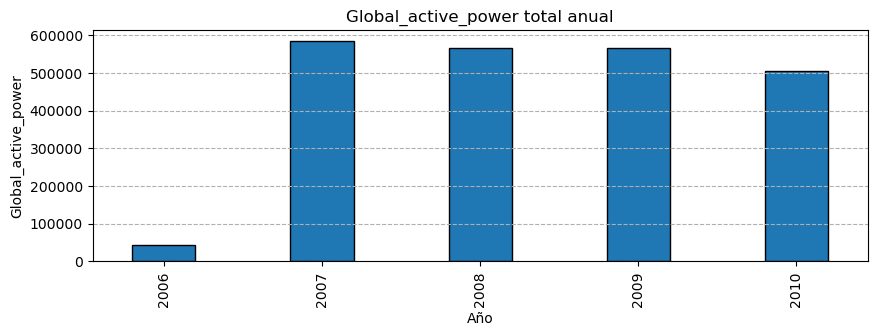

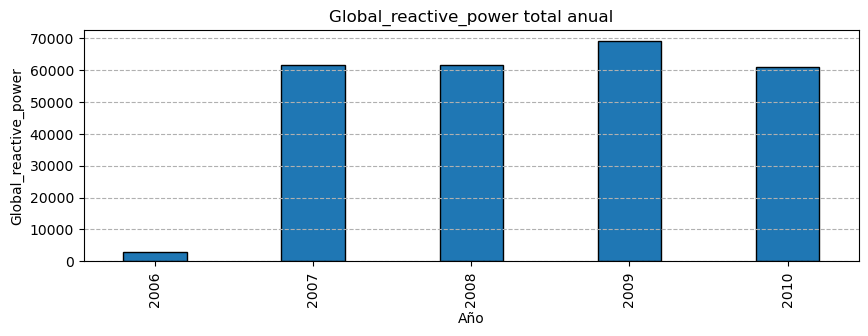

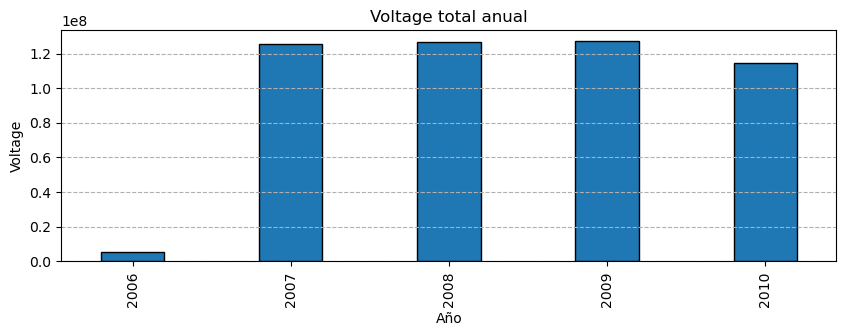

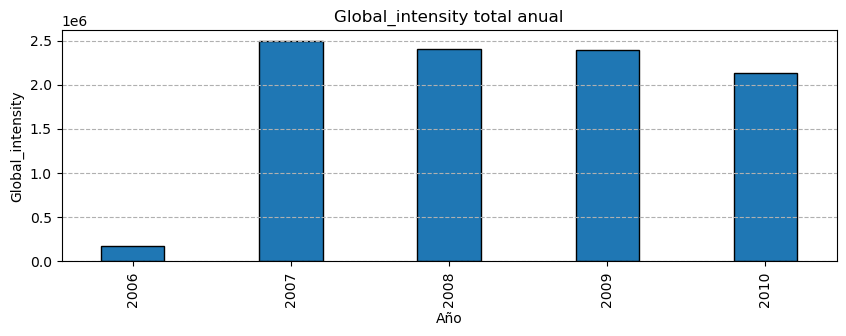

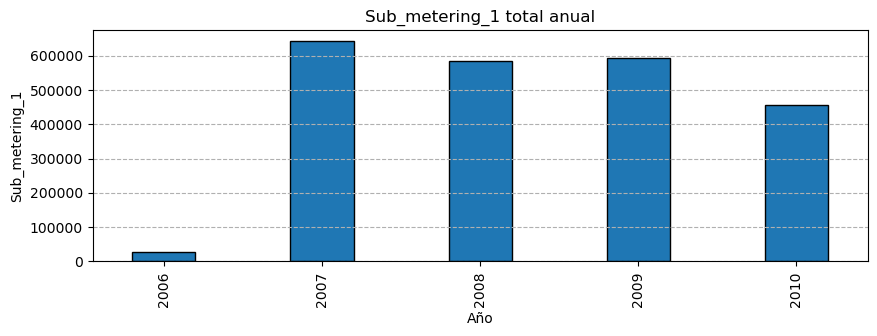

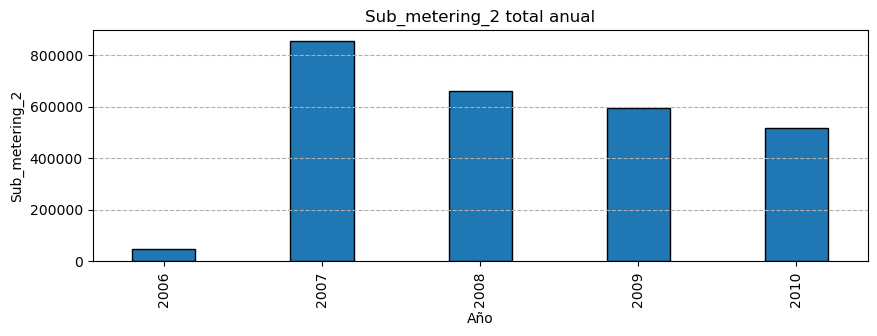

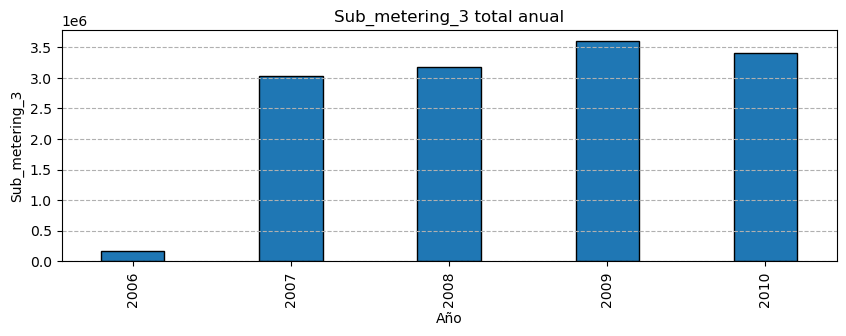

In [51]:
barra_año(df)

3. **Gráfico Promedios Anuales**

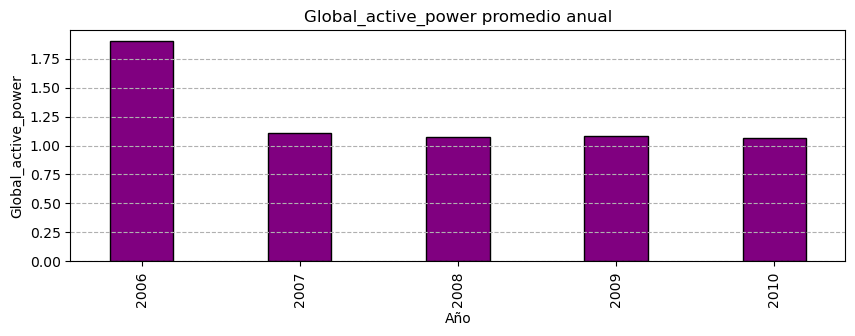

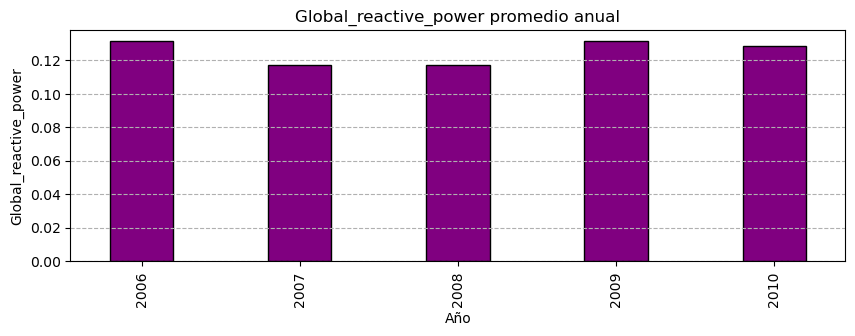

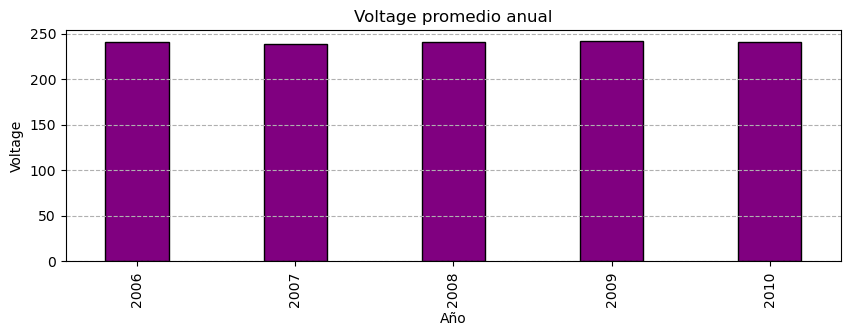

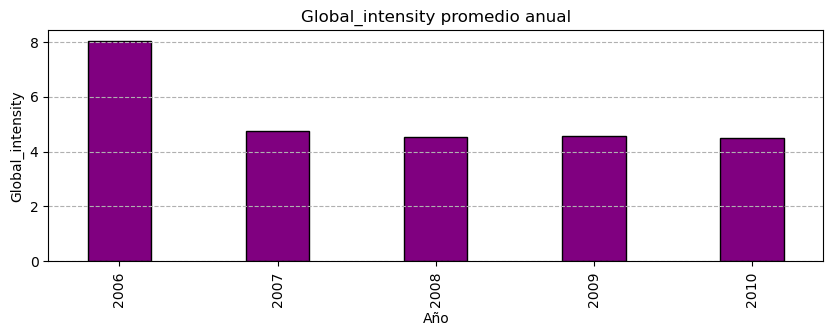

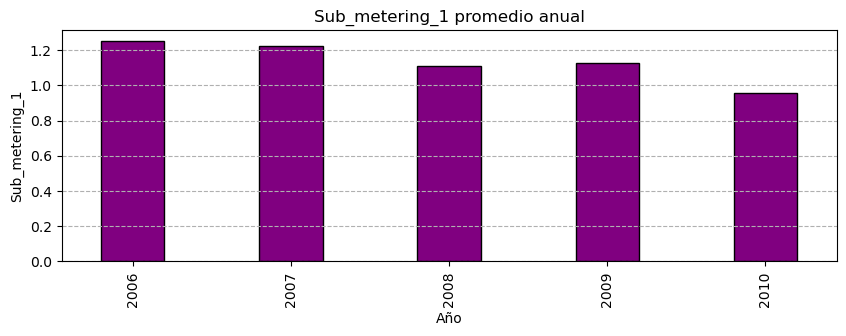

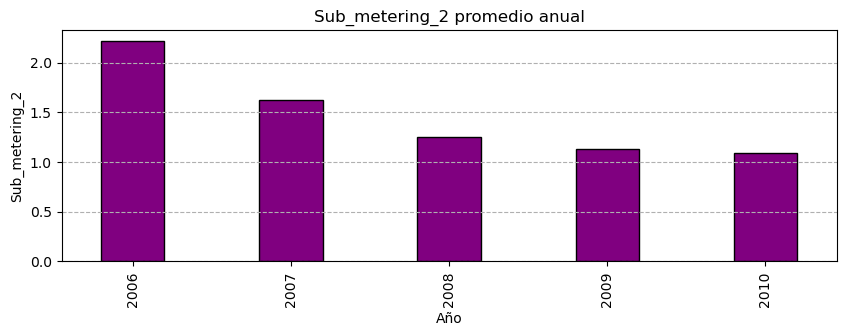

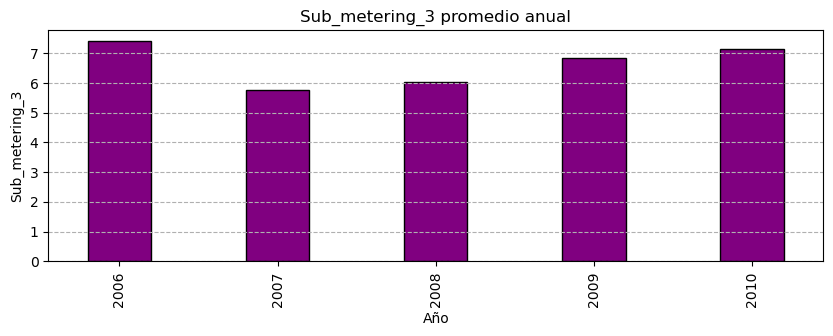

In [52]:
barra_promedio_año(df)

* Como para 2006 solo tenemos datos de diciembre, la cantidad total es insignificante y por lo tanto se considera eliminar los datos del 2006.

In [53]:
df = df[~(df.index.year == 2006)]

### Análisis mensual

1. **Estadística descriptiva mensual**

In [54]:
for col in df.columns:
    d = df[col].groupby(df.index.month).describe()
    print(f"Descripción de la columna: {col}")
    display(d)
    print()

Descripción de la columna: Global_active_power


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,1.467443,1.212671,0.198,0.400,1.384,2.006000,10.162
2,162720.0,1.300329,1.164354,0.198,0.334,1.262,1.766000,11.122
3,178560.0,1.226522,1.097509,0.196,0.350,0.922,1.644000,10.670
4,172800.0,1.032375,0.971901,0.104,0.334,0.508,1.482000,9.482
5,178560.0,1.029572,0.939278,0.106,0.332,0.590,1.482000,8.944
6,172800.0,0.915760,0.890227,0.082,0.272,0.482,1.374000,8.760
7,178560.0,0.700603,0.732014,0.098,0.240,0.354,1.038000,7.240
8,178560.0,0.579623,0.707129,0.076,0.180,0.268,0.779538,8.694
9,172800.0,0.983779,0.946296,0.098,0.268,0.548,1.446000,8.110



Descripción de la columna: Global_reactive_power


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,0.110749,0.107148,0.0,0.000,0.090,0.162,1.096
2,162720.0,0.099676,0.101483,0.0,0.000,0.080,0.138,1.032
3,178560.0,0.113571,0.107801,0.0,0.000,0.092,0.178,0.968
4,172800.0,0.123216,0.112546,0.0,0.048,0.102,0.194,1.390
5,178560.0,0.127905,0.111575,0.0,0.052,0.102,0.198,1.078
6,172800.0,0.146390,0.119664,0.0,0.070,0.118,0.218,1.148
7,178560.0,0.152023,0.119170,0.0,0.076,0.124,0.224,1.218
8,178560.0,0.137693,0.113522,0.0,0.048,0.124,0.216,1.044
9,172800.0,0.129579,0.112632,0.0,0.050,0.105,0.204,1.100



Descripción de la columna: Voltage


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,242.227328,3.674801,224.68,239.76,242.485,244.85,253.94
2,162720.0,241.460423,3.369517,223.49,239.25,241.600,243.82,252.65
3,178560.0,241.541034,2.939284,226.95,239.66,241.790,243.60,250.23
4,172800.0,240.923233,2.785850,225.33,239.48,241.210,242.79,250.18
5,178560.0,239.008470,3.578694,223.20,236.59,239.590,241.66,249.44
6,172800.0,239.913338,2.708294,226.20,238.58,240.310,241.73,247.89
7,178560.0,240.003649,2.808939,224.44,238.70,240.430,241.88,250.92
8,178560.0,240.222606,2.646316,226.46,239.18,240.740,241.99,247.52
9,172800.0,240.397891,2.362463,227.46,238.92,240.520,242.02,248.38



Descripción de la columna: Global_intensity


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,6.155872,5.105484,0.8,1.8,5.6,8.400000,44.2
2,162720.0,5.446727,4.910716,0.8,1.4,5.2,7.400000,48.4
3,178560.0,5.157888,4.625281,0.8,1.6,4.0,6.800000,46.4
4,172800.0,4.363126,4.088213,0.4,1.4,2.4,6.200000,40.8
5,178560.0,4.403165,3.985278,0.6,1.4,2.6,6.200000,39.0
6,172800.0,3.951315,3.754734,0.4,1.2,2.2,5.800000,37.6
7,178560.0,3.063529,3.074987,0.4,1.0,1.6,4.600000,31.0
8,178560.0,2.539633,2.980531,0.2,0.8,1.4,3.373717,37.4
9,172800.0,4.201241,3.973178,0.4,1.2,2.4,6.000000,35.4



Descripción de la columna: Sub_metering_1


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,1.399322,6.886924,0.0,0.0,0.0,0.0,84.0
2,162720.0,1.131883,6.172810,0.0,0.0,0.0,0.0,88.0
3,178560.0,1.252571,6.528930,0.0,0.0,0.0,0.0,77.0
4,172800.0,1.052431,6.032455,0.0,0.0,0.0,0.0,87.0
5,178560.0,1.234876,6.362685,0.0,0.0,0.0,0.0,80.0
6,172800.0,1.305035,6.568452,0.0,0.0,0.0,0.0,80.0
7,178560.0,0.707297,4.865317,0.0,0.0,0.0,0.0,79.0
8,178560.0,0.485249,4.034486,0.0,0.0,0.0,0.0,78.0
9,172800.0,1.120856,6.101205,0.0,0.0,0.0,0.0,76.0



Descripción de la columna: Sub_metering_2


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,1.539180,6.911237,0.0,0.0,0.0,0.441693,78.0
2,162720.0,1.386268,6.378618,0.0,0.0,0.0,0.000000,80.0
3,178560.0,1.654155,6.842830,0.0,0.0,0.0,1.000000,78.0
4,172800.0,1.147946,5.281850,0.0,0.0,0.0,1.000000,75.0
5,178560.0,1.307804,5.623420,0.0,0.0,0.0,1.000000,75.0
6,172800.0,1.230041,5.198968,0.0,0.0,0.0,1.000000,76.0
7,178560.0,0.991930,4.187726,0.0,0.0,0.0,1.000000,75.0
8,178560.0,0.808706,3.865297,0.0,0.0,0.0,1.000000,76.0
9,172800.0,1.149051,4.968418,0.0,0.0,0.0,1.000000,74.0



Descripción de la columna: Sub_metering_3


,count,mean,std,min,25%,50%,75%,max
dt,,,,,,,,
1,178560.0,7.824247,8.794481,0.0,0.0,1.0,18.0,30.0
2,162720.0,7.584857,8.806230,0.0,0.0,0.0,18.0,30.0
3,178560.0,6.855665,8.610027,0.0,0.0,0.0,18.0,30.0
4,172800.0,6.534219,8.498447,0.0,0.0,1.0,18.0,30.0
5,178560.0,6.696615,8.484051,0.0,0.0,1.0,17.0,31.0
6,172800.0,6.303319,8.382323,0.0,0.0,1.0,17.0,31.0
7,178560.0,4.272539,7.192480,0.0,0.0,1.0,1.0,31.0
8,178560.0,3.725510,6.616475,0.0,0.0,1.0,1.0,31.0
9,172800.0,6.452060,8.356854,0.0,0.0,1.0,17.0,31.0


2. **Gráfico totales mesuales**

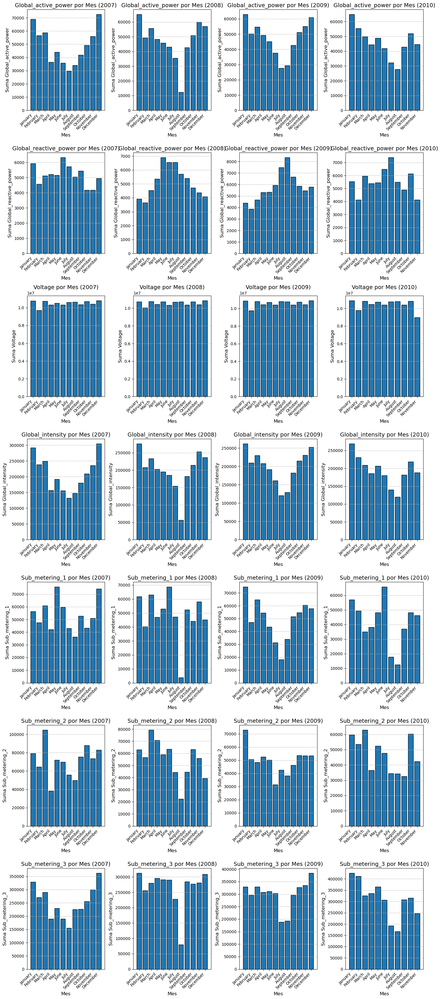

In [55]:
suma_mensual_columnas(df)

3. **Gráficos promedios mensuales**

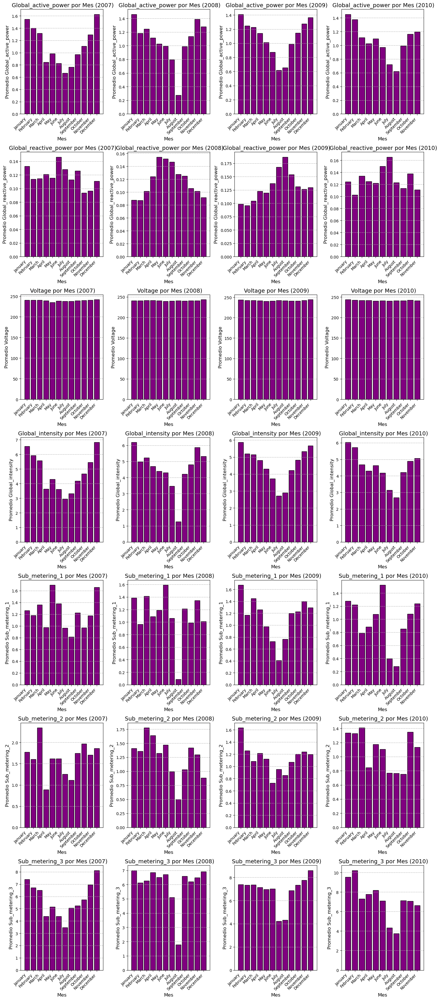

In [56]:
promedio_mensual_columnas(df)

Podemos visualizar que la variable Global active power, Global intensity y las submediciones tienen un decrecimiento en el promedio mensual en los meses de julio y agosto, esto se puede deber a que durante ese tiempo en Francia es verano y se utilizan menos aparatos eléctricos dentro del hogar. Sin embargo esto no explica por qué la variable Global reactive power aumenta durante esos meses. Por otro lado, el promedio mensual de la variable Voltage se mantiene constante durante el año.

### Análisis data original

4. **Gráfico distribución de cada variable**

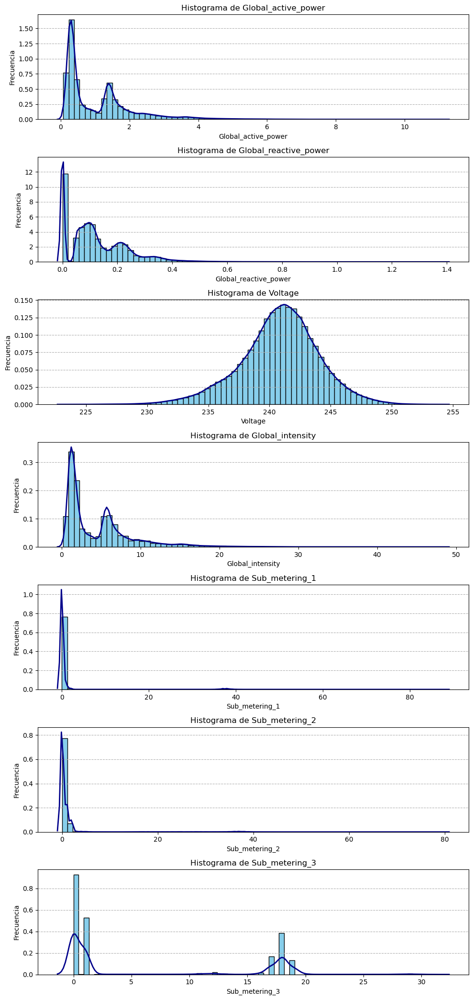

In [57]:
histograma_columnas(df)

Visualmente se identifica la distribución gaussiana de la variable Voltaje, sin embargo hay que verificarlo estadísticamente.

4. **Análisis de outliers**

Utilizaremos el rango intercuartílico pues es una medida de dispersión que no se ve influenciada por valores extremos. 
Al multiplicar el coeficiente de dispersión por el rango intercuartílico (RI), se obtiene una medida de amplitud que permite establecer un rango dentro del cual se considera que los valores son típicos o no atípicos. El valor más utilizado para el coeficiente de dispersión es 1.5, el cual es un valor restrictivo y que permite un gran rango de posibles valores outliers.
Los valores por debajo de Q1 - 1.5 * RI y por encima de Q3 + 1.5 * RI se consideran outliers.

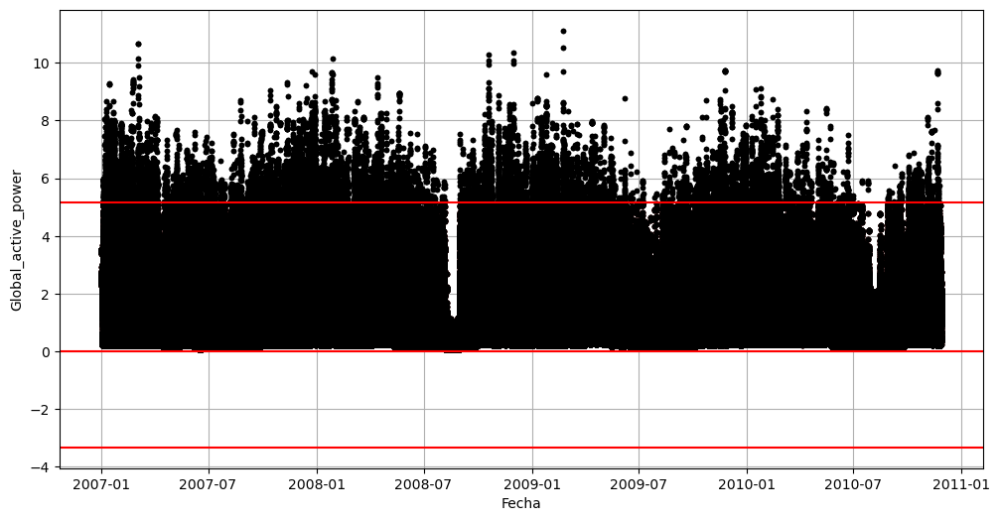

La desviación estándar de la variable Global_active_power es 1.04
El promedio de la variable Global_active_power es 1.08
El máximo de la variable Global_active_power es 11.12
El mínimo de la variable Global_active_power es 0.08
El porcentaje de outliers de la variable Global_active_power es 0.7


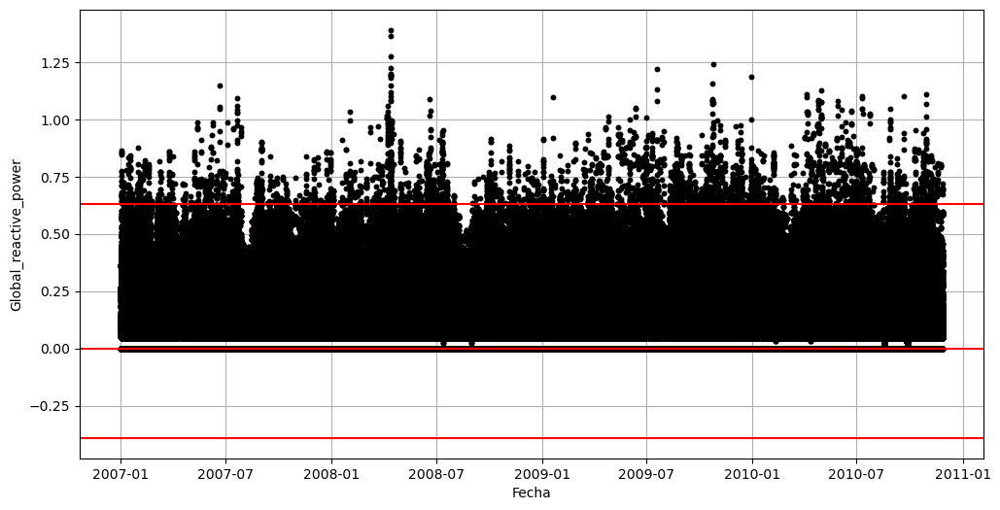

La desviación estándar de la variable Global_reactive_power es 0.11
El promedio de la variable Global_reactive_power es 0.12
El máximo de la variable Global_reactive_power es 1.39
El mínimo de la variable Global_reactive_power es 0.0
El porcentaje de outliers de la variable Global_reactive_power es 0.19


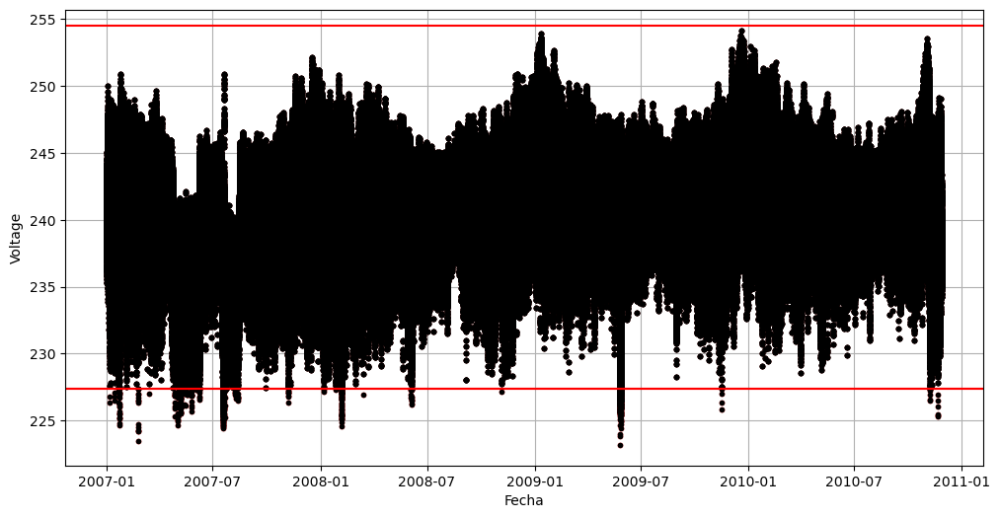

La desviación estándar de la variable Voltage es 3.23
El promedio de la variable Voltage es 240.83
El máximo de la variable Voltage es 254.15
El mínimo de la variable Voltage es 223.2
El porcentaje de outliers de la variable Voltage es 0.05


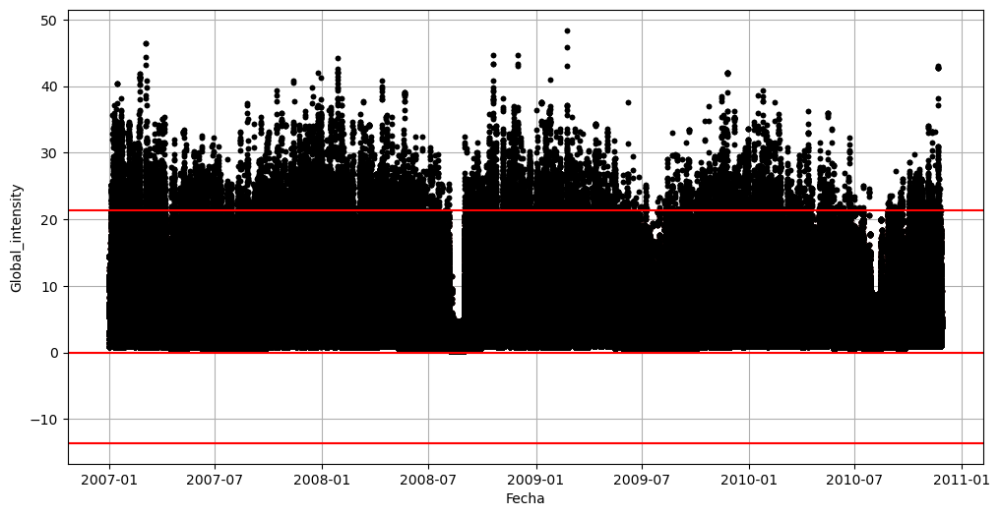

La desviación estándar de la variable Global_intensity es 4.39
El promedio de la variable Global_intensity es 4.58
El máximo de la variable Global_intensity es 48.4
El mínimo de la variable Global_intensity es 0.2
El porcentaje de outliers de la variable Global_intensity es 0.78


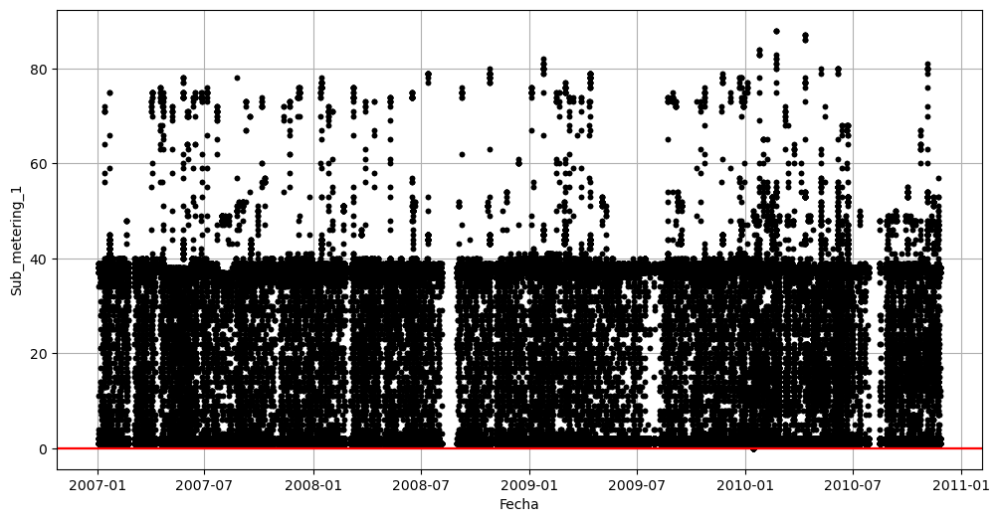

La desviación estándar de la variable Sub_metering_1 es 6.11
El promedio de la variable Sub_metering_1 es 1.11
El máximo de la variable Sub_metering_1 es 88.0
El mínimo de la variable Sub_metering_1 es 0.0
El porcentaje de outliers de la variable Sub_metering_1 es 8.32


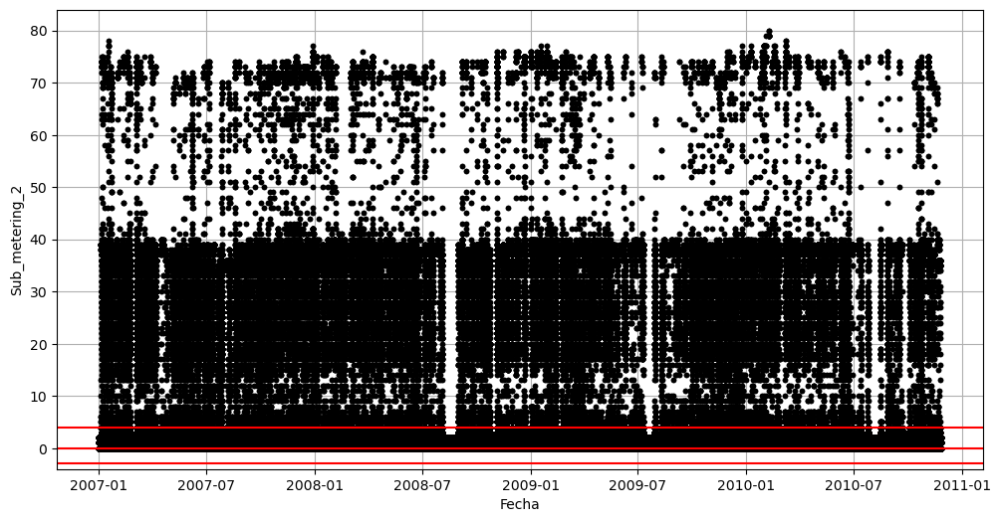

La desviación estándar de la variable Sub_metering_2 es 5.75
El promedio de la variable Sub_metering_2 es 1.28
El máximo de la variable Sub_metering_2 es 80.0
El mínimo de la variable Sub_metering_2 es 0.0
El porcentaje de outliers de la variable Sub_metering_2 es 3.07


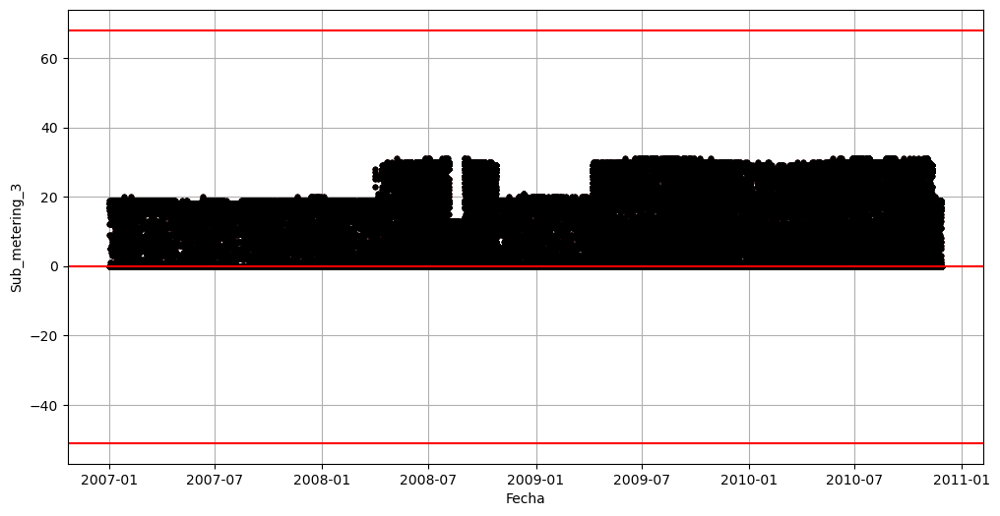

La desviación estándar de la variable Sub_metering_3 es 8.41
El promedio de la variable Sub_metering_3 es 6.43
El máximo de la variable Sub_metering_3 es 31.0
El mínimo de la variable Sub_metering_3 es 0.0
El porcentaje de outliers de la variable Sub_metering_3 es 0.0


In [58]:
analisis(df)

* El porcentaje de outliers para todas las variables excepto sub_metering 1 y submetering_2 no supera el 1%.
* En general ninguna variable supera el 9% de outliers.

### Análisis diario

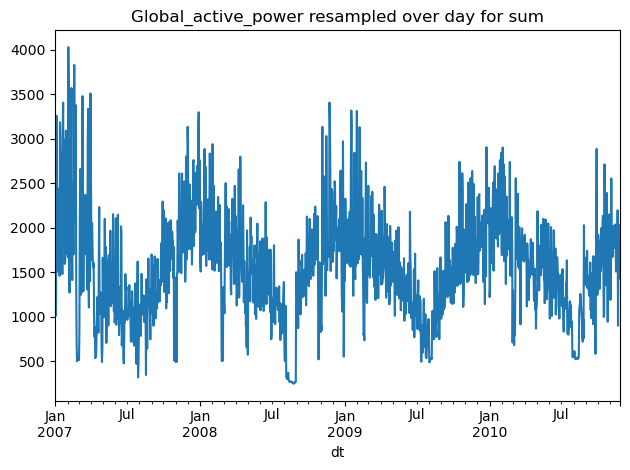

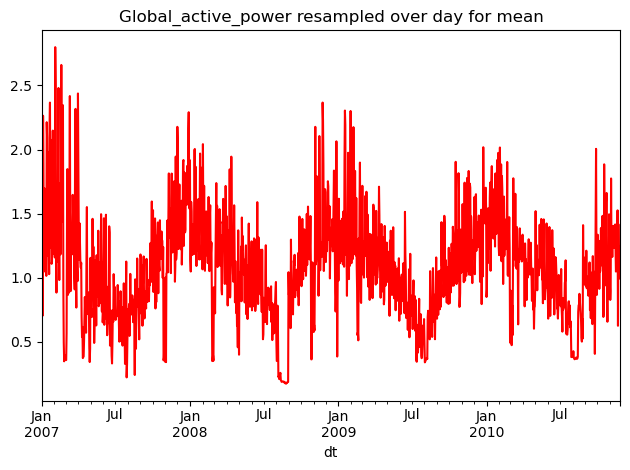

In [59]:
df.Global_active_power.resample('D').sum().plot(title='Global_active_power resampled over day for sum') 
#df.Global_active_power.resample('D').mean().plot(title='Global_active_power resampled over day', color='red') 
plt.tight_layout()
plt.show()   

df.Global_active_power.resample('D').mean().plot(title='Global_active_power resampled over day for mean', color='red') 
plt.tight_layout()
plt.show()

**Análisis de outliers**

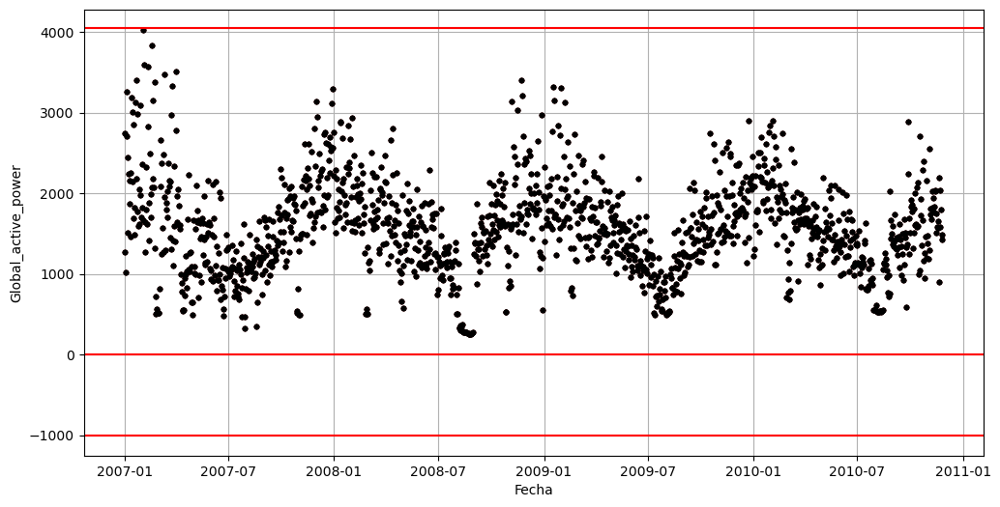

La desviación estándar de la variable Global_active_power es 586.78
El promedio de la variable Global_active_power es 1557.35
El máximo de la variable Global_active_power es 4029.72
El mínimo de la variable Global_active_power es 250.3
El porcentaje de outliers de la variable Global_active_power es 0.0


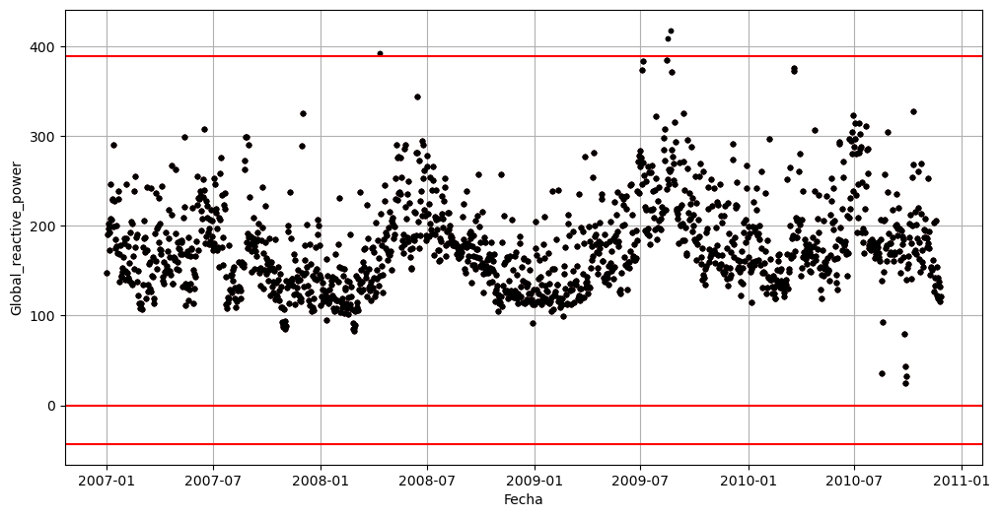

La desviación estándar de la variable Global_reactive_power es 50.14
El promedio de la variable Global_reactive_power es 177.92
El máximo de la variable Global_reactive_power es 417.83
El mínimo de la variable Global_reactive_power es 24.72
El porcentaje de outliers de la variable Global_reactive_power es 0.21


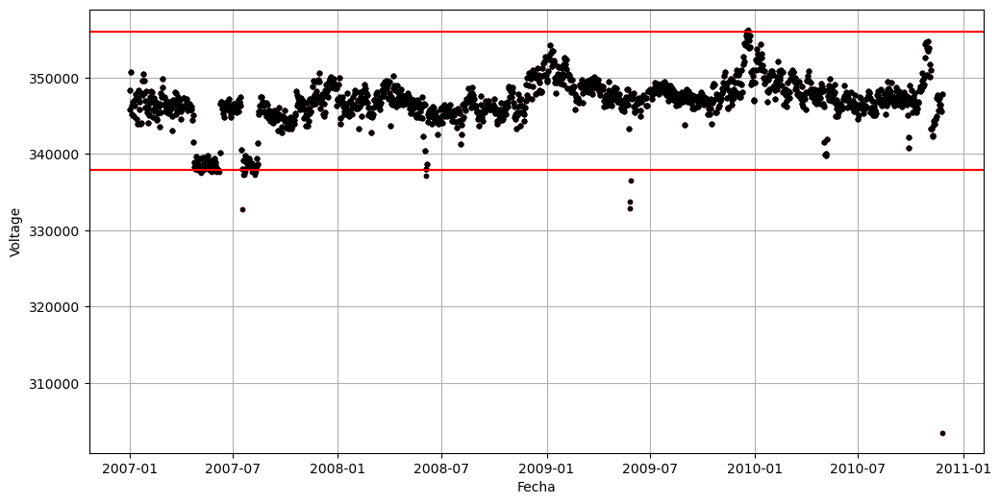

La desviación estándar de la variable Voltage es 3170.95
El promedio de la variable Voltage es 346759.94
El máximo de la variable Voltage es 356306.41
El mínimo de la variable Voltage es 303487.57
El porcentaje de outliers de la variable Voltage es 1.47


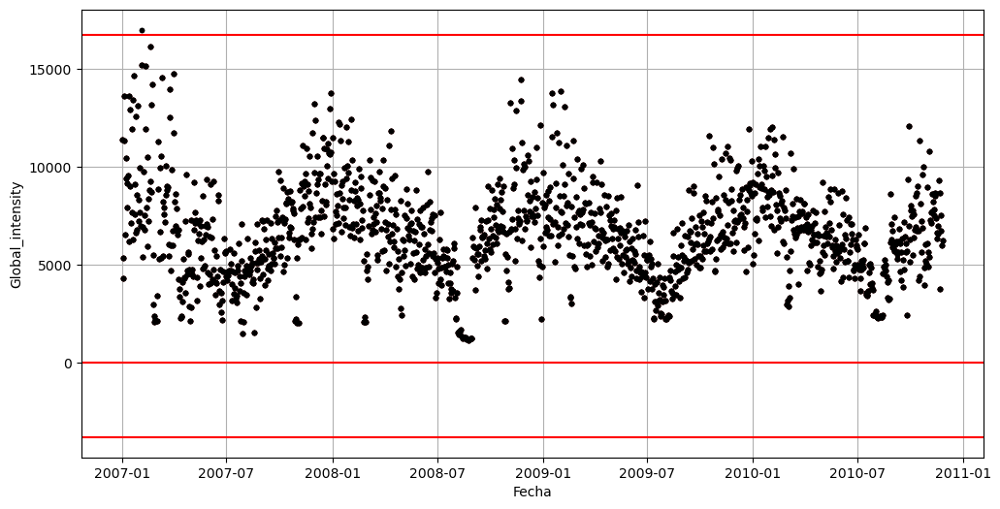

La desviación estándar de la variable Global_intensity es 2425.92
El promedio de la variable Global_intensity es 6601.77
El máximo de la variable Global_intensity es 17015.0
El mínimo de la variable Global_intensity es 1164.0
El porcentaje de outliers de la variable Global_intensity es 0.07


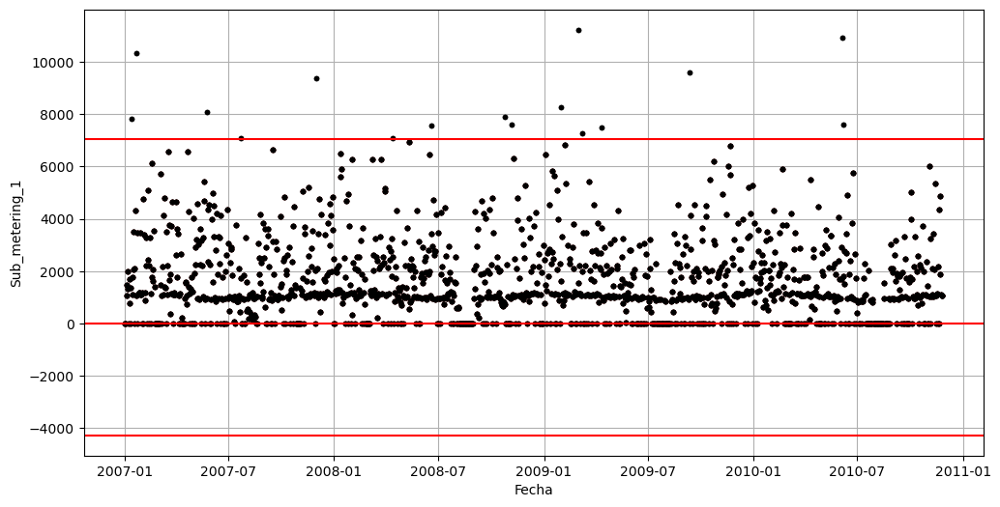

La desviación estándar de la variable Sub_metering_1 es 1586.81
El promedio de la variable Sub_metering_1 es 1595.33
El máximo de la variable Sub_metering_1 es 11224.0
El mínimo de la variable Sub_metering_1 es 0.0
El porcentaje de outliers de la variable Sub_metering_1 es 1.12


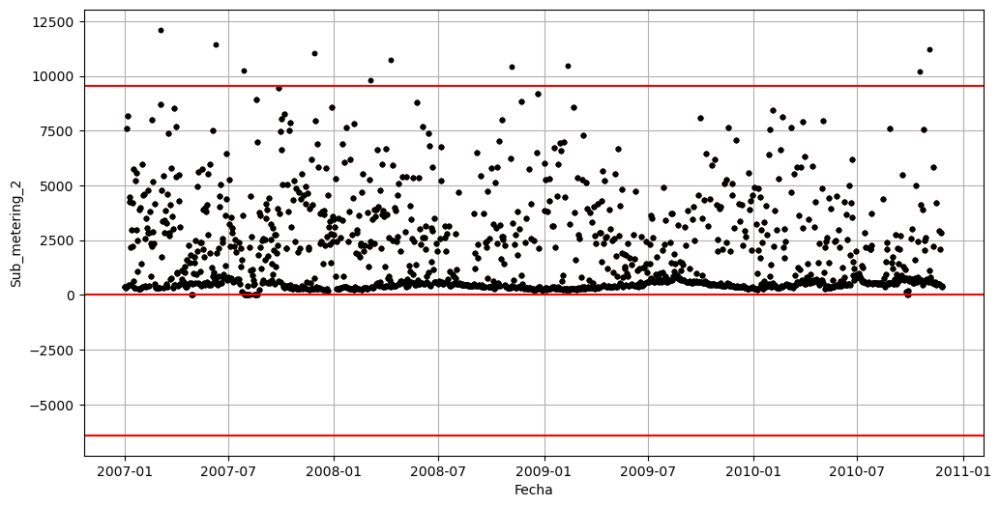

La desviación estándar de la variable Sub_metering_2 es 2078.74
El promedio de la variable Sub_metering_2 es 1842.02
El máximo de la variable Sub_metering_2 es 12109.0
El mínimo de la variable Sub_metering_2 es 0.0
El porcentaje de outliers de la variable Sub_metering_2 es 0.7


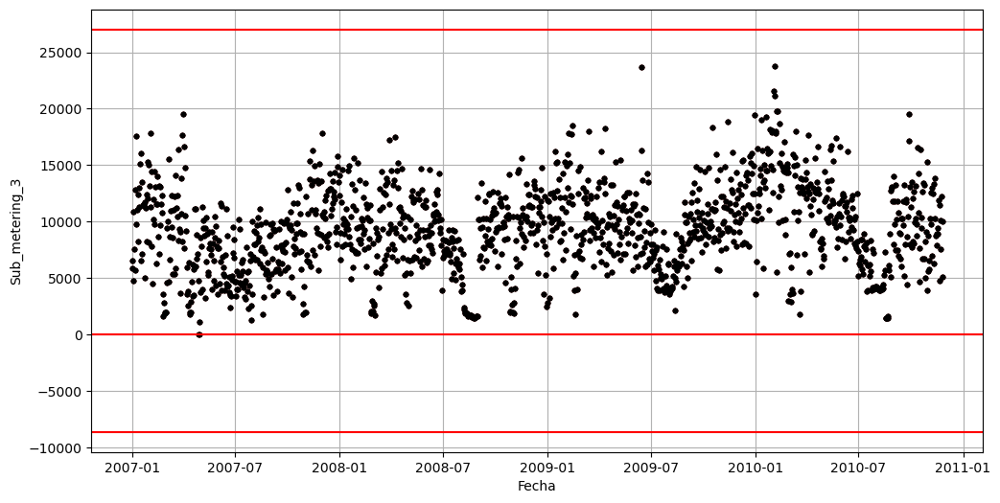

La desviación estándar de la variable Sub_metering_3 es 3776.73
El promedio de la variable Sub_metering_3 es 9261.31
El máximo de la variable Sub_metering_3 es 23743.0
El mínimo de la variable Sub_metering_3 es 0.0
El porcentaje de outliers de la variable Sub_metering_3 es 0.0


In [60]:
analisis(df.resample('D').sum())

## Análisis bivariable

El análisis bivariable lo haremos para los datos agrupados diariamente, dado que los modelos predictivos los realizaremos con los datos agrupados diariamente. 

In [61]:
# Agrupar por día y calcular la suma del consumo de energía eléctrica para cada día
df_diario = df.resample('D').sum()

1. **Relación de dispersión entre pares de variables**

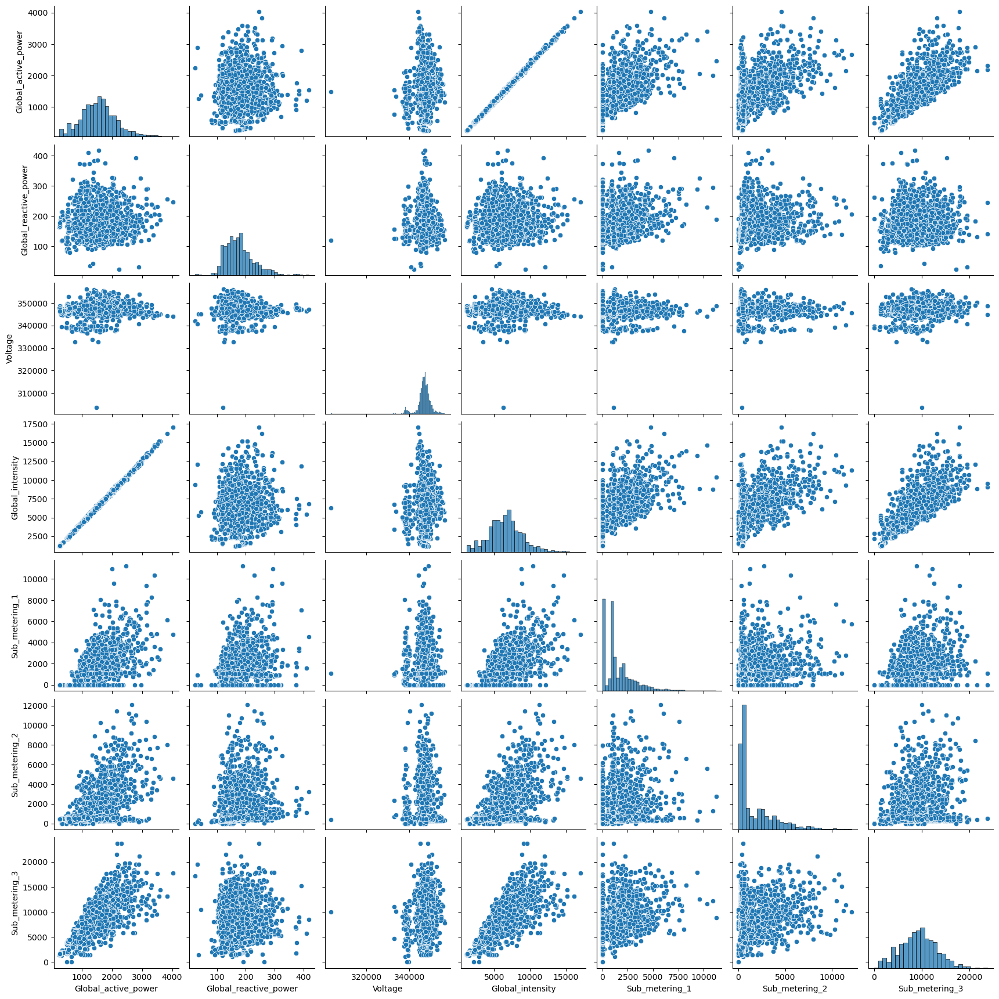

In [62]:
sns.pairplot(df_diario)

# Mostrar el gráfico

La alta relación lineal entre las varias variables Global active power y Global intensity se debe a la relación lineal que hay entre la potencia y la intensidad eléctrica.

2. **Relación de correlación entre pares de variables**

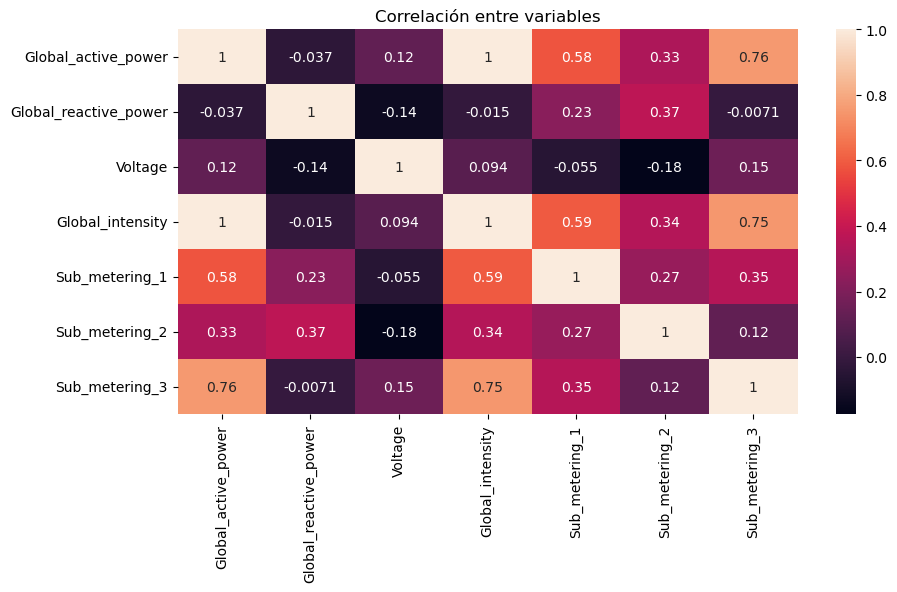

In [63]:
# Análisis de la correlación entre variables
#Utilizamos el método no paramétrico de spearman
corr = df_diario.corr('spearman')
plt.figure(figsize=(10, 5))
sns.heatmap(corr, annot=True)
plt.title("Correlación entre variables")
plt.show()

La mayoría de las variables no tienen un alto porcentaje de correlación entre ellas, por lo que no tendremos problemas con la colinealidad. Sin embargo, las variables que tienen un porcentaje de correlación de 74% y 75% son dignas de estudio. 

## Análisis multivariable

### Análisis Anual

1. **Gráfico total submediciones anuales**

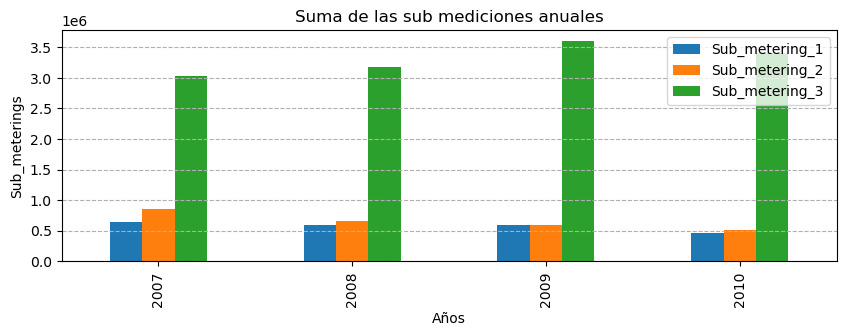

In [64]:
df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].groupby(df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].index.year).sum().plot(kind="bar",xlabel='Años',ylabel='Sub_meterings',title="Suma de las sub mediciones anuales",figsize=(10,3)).grid(axis='y', which='major', linestyle='--')

2. **Gráfico promedio submediciones anuales**

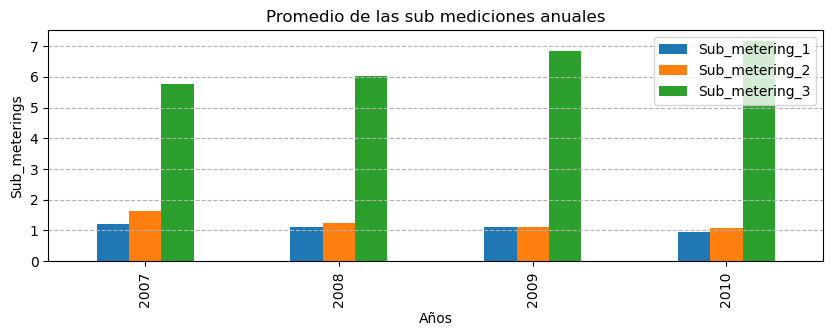

In [65]:
df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].groupby(df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].index.year).mean().plot(kind="bar",xlabel='Años',ylabel='Sub_meterings',title="Promedio de las sub mediciones anuales",figsize=(10,3)).grid(axis='y', which='major', linestyle='--')

### Análisis Mensual

1. **Gráfico total submediciones mensuales**

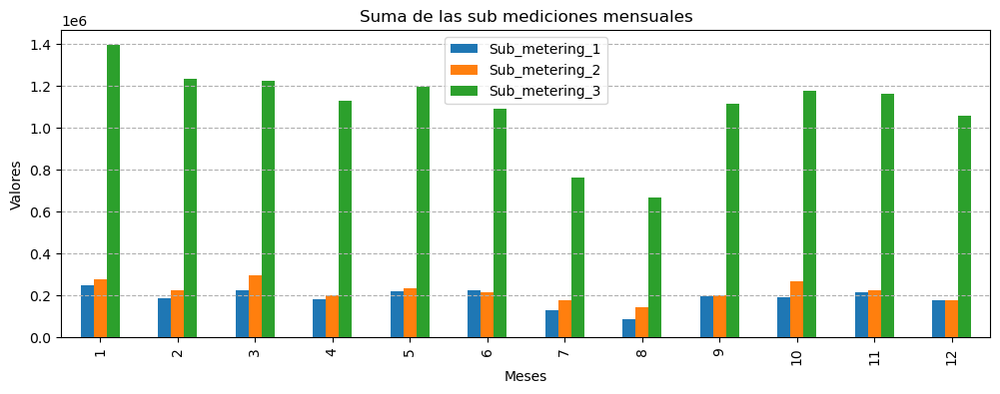

In [66]:
df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].groupby(df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].index.month).sum().plot(kind="bar",xlabel='Meses',ylabel='Valores',title="Suma de las sub mediciones mensuales",figsize=(12,4)).grid(axis='y', which='major', linestyle='--')

2. **Gráfico promedio submediciones mensuales**

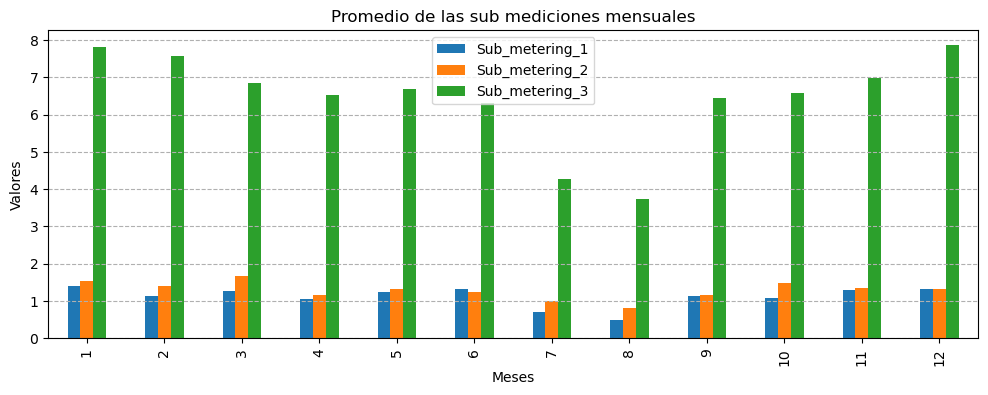

In [67]:
df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].groupby(df[['Sub_metering_1','Sub_metering_2','Sub_metering_3']].index.month).mean().plot(kind="bar",xlabel='Meses',ylabel='Valores',title="Promedio de las sub mediciones mensuales",figsize=(12,4)).grid(axis='y', which='major', linestyle='--')

### Reducción de dimensionalidad

Componente	Porcentaje de Varianza
Componente 1:	58.63%
Componente 2:	41.37%


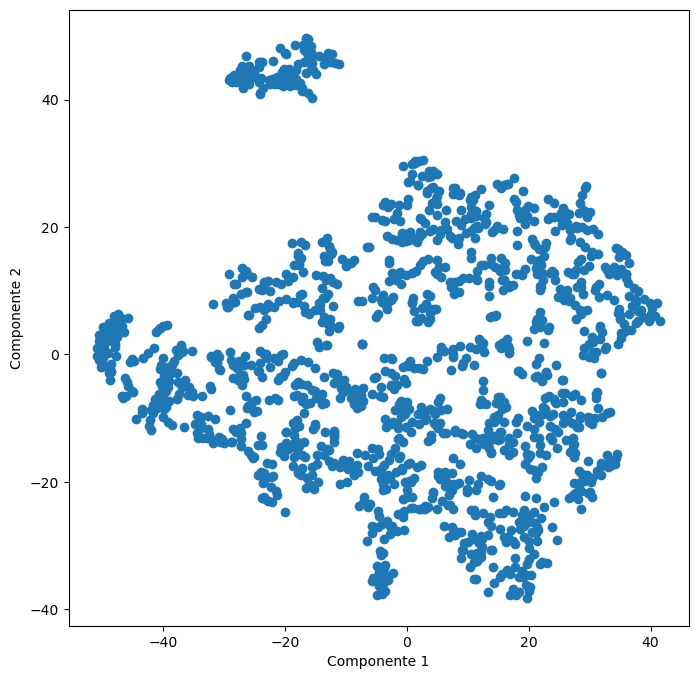

In [68]:
tsne_plot(df_diario, 2)

* El componente 1 explica el 57.96% de la varianza total, lo cual indica que es el componente más relevante y que contiene la mayor parte de la información importante de los datos. 
* El componente 2, por su parte, explica el 42.04% restante de la varianza, lo que indica que también es significativo pero captura una cantidad menor de información en comparación con el componente 1.

Componente	Porcentaje de Varianza
Componente 1:	56.96%
Componente 2:	34.61%
Componente 3:	8.43%


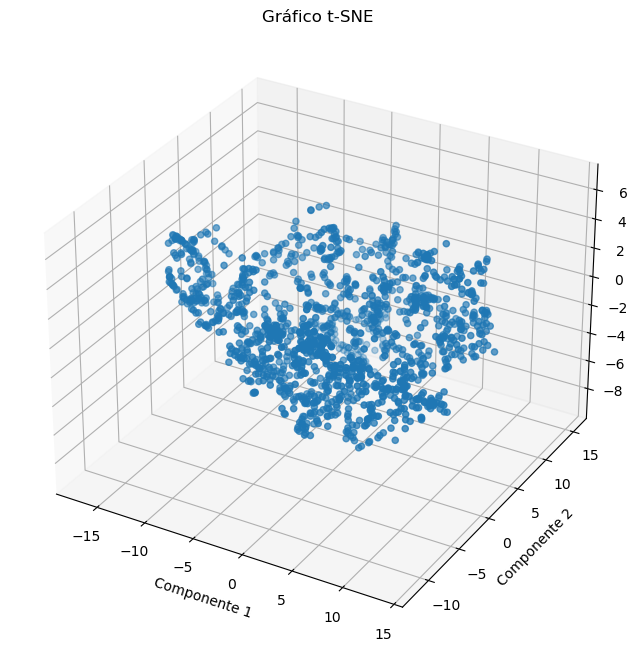

In [69]:
tsne_plot(df_diario, 3)

* El componente 1 explica el 56.62% de la varianza total, lo cual indica que es el componente más relevante y que contiene la mayor parte de la información importante de los datos. 
* El componente 2, por su parte, explica el 34.95% de la varianza, lo que indica que también es significativo pero captura una cantidad menor de información en comparación con el componente 1. 
* El componente 3 explica el 9.43% de la varianza total, lo que indica que es poco significativa.

     Componente  Porcentaje de Varianza
0  Componente 1               62.945576
1  Componente 2               37.054424


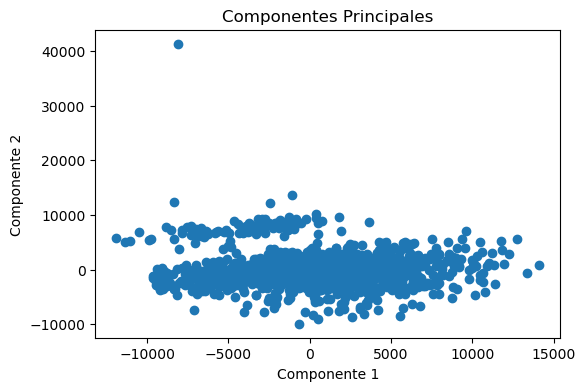

array([0.62945576, 0.37054424])

In [70]:
kernel_pca(df_diario, 2)

* El componente 1 explica el 63.366583 % de la varianza total, lo cual indica que es el componente más relevante y que contiene la mayor parte de la información importante de los datos. 
* El componente 2, por su parte, explica el 36.633417% restante de la varianza, lo que indica que también es significativo pero captura una cantidad menor de información en comparación con el componente 1

     Componente  Porcentaje de Varianza
0  Componente 1               55.206765
1  Componente 2               29.315613
2  Componente 3               15.477622


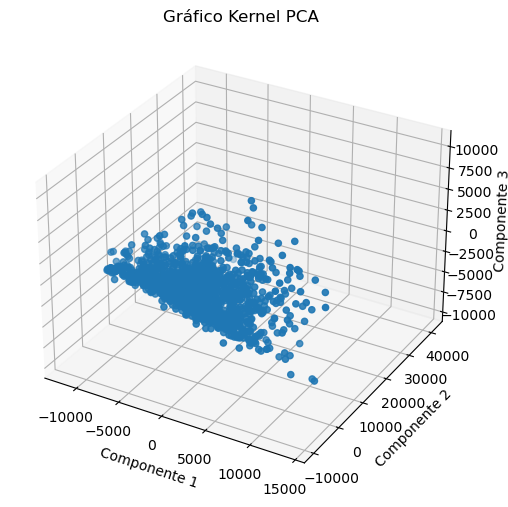

array([0.55206765, 0.29315613, 0.15477622])

In [71]:
kernel_pca(df_diario, 3)

* El componente 1 explica el 55.531865% de la varianza total, lo cual indica que es el componente más relevante y que contiene la mayor parte de la información importante de los datos. 
* El componente 2, por su parte, explica el 28.798699% de la varianza, lo que indica que también es significativo pero captura una cantidad menor de información en comparación con el componente 1. 
* El componente 3 explica el 15.669436% de la varianza total, lo que indica que es poco significativa.

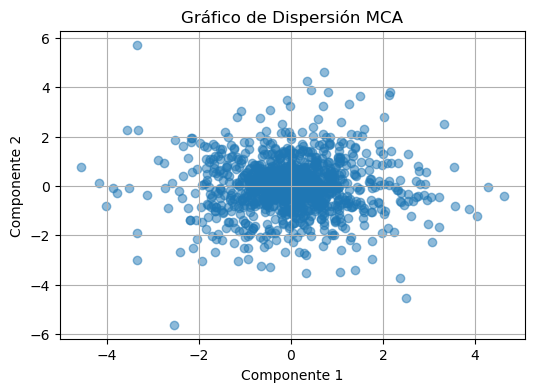

Componente 1: 50.02% de varianza explicada
Componente 2: 49.98% de varianza explicada


In [72]:
mca(df_diario, 2)

* El componente 1 explica el 50.02 % de la varianza total, lo cual indica que es relevante y que contiene la mayor parte de la información importante de los datos. 
* El componente 2, por su parte, explica el 49.98% restante de la varianza, lo que indica que también es significativo.

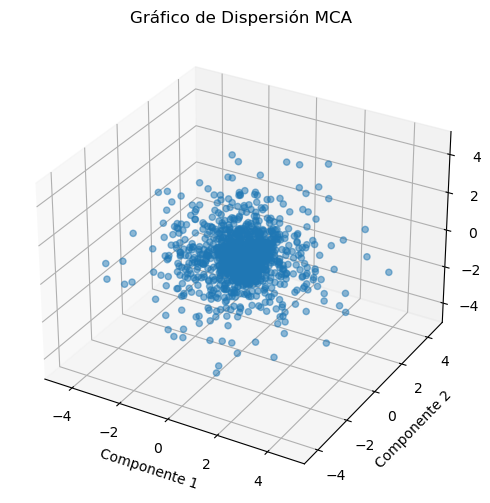

Componente 1: 33.34% de varianza explicada
Componente 2: 33.34% de varianza explicada
Componente 3: 33.32% de varianza explicada


In [73]:
mca(df_diario, 3)

* Notemos que las 3 componentes explican practicamente el mismo porcentaje.

### Detección de Outliers

Utilizaremos DBSCAN como segundo método para la detección de outliers. 
* DBSCAN utiliza la densidad de los puntos para agrupar y detectar outliers en los datos. 
* Agrupa los puntos que están cerca unos de otros y considera como outliers aquellos puntos que están aislados o no tienen suficientes vecinos cercanos.


* min_samples: Este parámetro define la cantidad mínima de puntos que deben estar dentro del radio eps para que un punto sea considerado como núcleo (core point).
* eps: Este parámetro define el radio máximo que se utilizará para buscar puntos vecinos alrededor de un punto central. Es esencialmente la distancia máxima entre dos puntos para que se consideren vecinos.

Probaremos eps en el rango [0.1 , 1.0] y min_samples en el rango [2 , 10].

El valor mínimo es 1426, su eps es 0.1 y su min_samples es 2
El valor máximo es 1426, su eps es 0.1 y su min_samples es 2
El valor que más se repite es 1426 y se encuentra en las combinaciones de eps y num_samples:
[(0.1, 2), (0.2, 2), (0.3, 2), (0.4, 2), (0.5, 2), (0.6, 2), (0.7, 2), (0.8, 2), (0.9, 2), (1.0, 2), (0.1, 3), (0.2, 3), (0.3, 3), (0.4, 3), (0.5, 3), (0.6, 3), (0.7, 3), (0.8, 3), (0.9, 3), (1.0, 3), (0.1, 4), (0.2, 4), (0.3, 4), (0.4, 4), (0.5, 4), (0.6, 4), (0.7, 4), (0.8, 4), (0.9, 4), (1.0, 4), (0.1, 5), (0.2, 5), (0.3, 5), (0.4, 5), (0.5, 5), (0.6, 5), (0.7, 5), (0.8, 5), (0.9, 5), (1.0, 5), (0.1, 6), (0.2, 6), (0.3, 6), (0.4, 6), (0.5, 6), (0.6, 6), (0.7, 6), (0.8, 6), (0.9, 6), (1.0, 6), (0.1, 7), (0.2, 7), (0.3, 7), (0.4, 7), (0.5, 7), (0.6, 7), (0.7, 7), (0.8, 7), (0.9, 7), (1.0, 7), (0.1, 8), (0.2, 8), (0.3, 8), (0.4, 8), (0.5, 8), (0.6, 8), (0.7, 8), (0.8, 8), (0.9, 8), (1.0, 8), (0.1, 9), (0.2, 9), (0.3, 9), (0.4, 9), (0.5, 9), (0.6, 9), (0.7, 9), (0.8, 9), (0.9

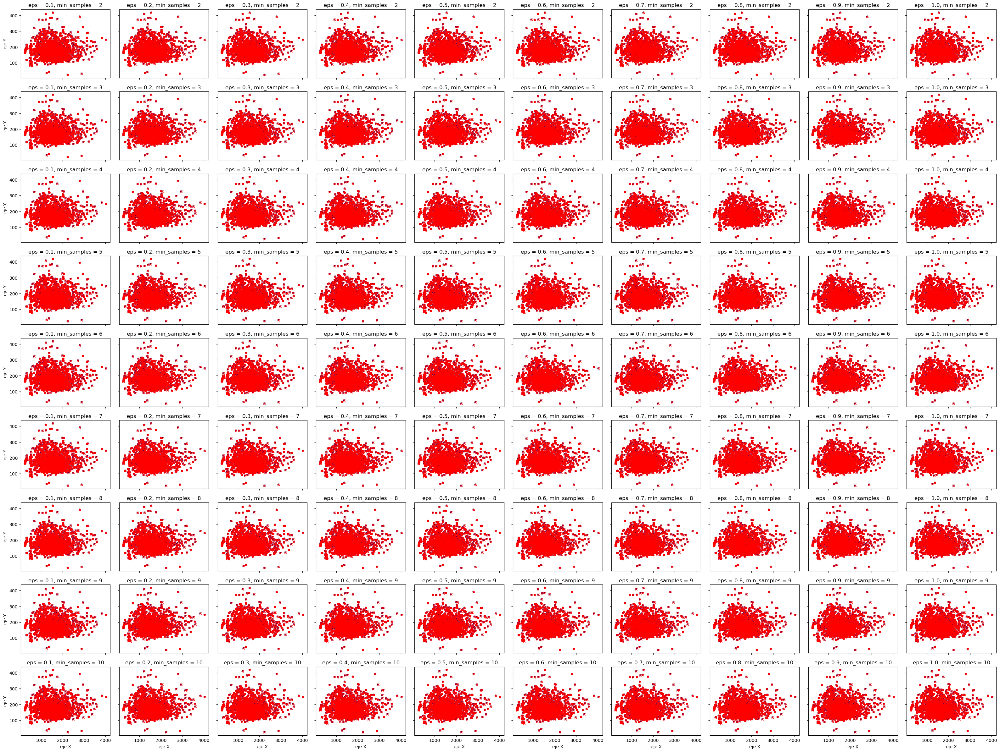

In [74]:
resultados = combinaciones(df_diario)
print(resultados)

Esta tabla muestra 
* Como índice de las filas los distintos valores de min_samples.
* Como índice de las columnas los distintos valores de eps.

El valor mínimo es 0, su eps es 0.6 y su min_samples es 2
El valor máximo es 749, su eps es 0.1 y su min_samples es 10
El valor que más se repite es 0 y se encuentra en las combinaciones de eps y num_samples:
[(0.1, 2), (0.2, 2), (0.3, 2), (0.4, 2), (0.5, 2), (0.1, 3), (0.2, 3), (0.3, 3), (0.4, 3), (0.5, 3), (0.1, 4), (0.2, 4), (0.3, 4), (0.4, 4), (0.5, 4), (0.1, 5), (0.2, 5), (0.3, 5), (0.4, 5), (0.5, 5), (0.1, 6), (0.2, 6), (0.3, 6), (0.4, 6), (0.5, 6), (0.1, 7), (0.2, 7), (0.3, 7), (0.4, 7), (0.5, 7), (0.1, 8), (0.2, 8), (0.3, 8), (0.4, 8), (0.5, 8), (0.1, 9), (0.2, 9), (0.3, 9), (0.4, 9), (0.5, 9), (0.1, 10), (0.2, 10), (0.3, 10), (0.4, 10), (0.5, 10)]
 
    0.1  0.2 0.3 0.4 0.5 0.6 0.7 0.8 0.9 1.0
2   378   33   5   1   1   0   0   0   0   0
3   430   49   5   1   1   0   0   0   0   0
4   509   54   6   1   1   0   0   0   0   0
5   565   70  10   1   1   0   0   0   0   0
6   627   79  10   1   1   0   0   0   0   0
7   656   87  11   1   1   0   0   0   0   0
8   686   93  11  

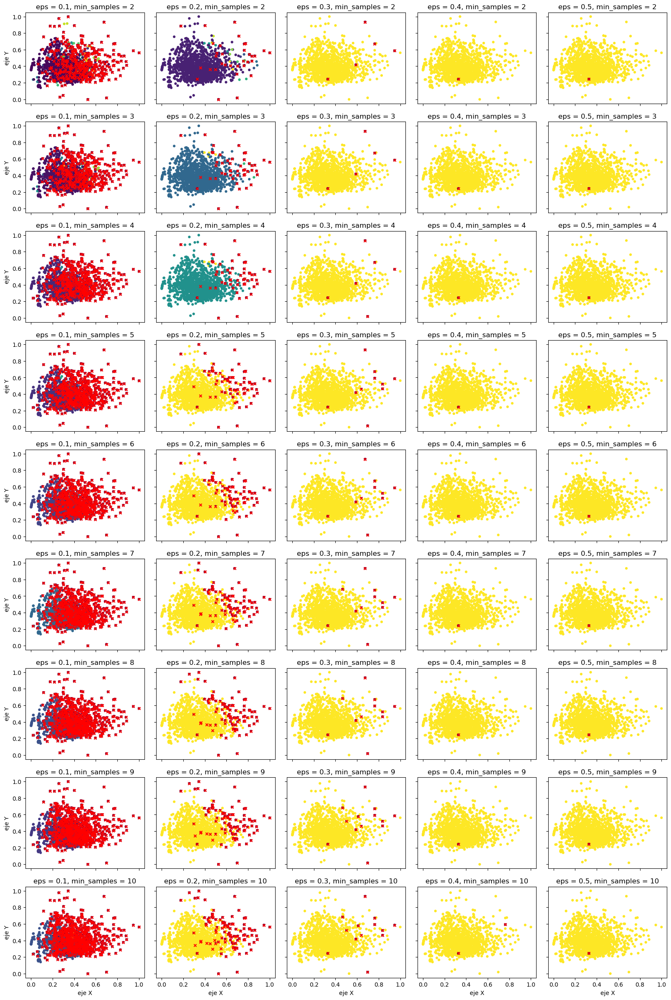

In [75]:
# Dataframe escalado con MinMaxScaler
scaler = MinMaxScaler()
# Escalamos el dataframe con MinMaxScaler
df_diario_escalado_1 = pd.DataFrame(scaler.fit_transform(df_diario), columns=df_diario.columns)
resultados_1 = combinaciones(df_diario_escalado_1)
print(resultados_1)

El valor mínimo es 184, su eps es 1.0 y su min_samples es 2
El valor máximo es 1426, su eps es 0.1 y su min_samples es 5
El valor que más se repite es 1426 y se encuentra en las combinaciones de eps y num_samples:
[(0.1, 2), (0.2, 2), (0.3, 2), (0.4, 2), (0.5, 2), (0.6, 2), (0.7, 2), (0.8, 2), (0.9, 2), (1.0, 2), (0.1, 3), (0.2, 3), (0.3, 3), (0.4, 3), (0.5, 3), (0.6, 3), (0.7, 3), (0.8, 3), (0.9, 3), (1.0, 3), (0.1, 4), (0.2, 4), (0.3, 4), (0.4, 4), (0.5, 4), (0.6, 4), (0.7, 4), (0.8, 4), (0.9, 4), (1.0, 4), (0.1, 5), (0.2, 5), (0.3, 5), (0.4, 5), (0.5, 5), (0.6, 5), (0.7, 5), (0.8, 5), (0.9, 5), (1.0, 5), (0.1, 6), (0.2, 6), (0.3, 6), (0.4, 6), (0.5, 6), (0.6, 6), (0.7, 6), (0.8, 6), (0.9, 6), (1.0, 6), (0.1, 7), (0.2, 7), (0.3, 7), (0.4, 7), (0.5, 7), (0.6, 7), (0.7, 7), (0.8, 7), (0.9, 7), (1.0, 7), (0.1, 8), (0.2, 8), (0.3, 8), (0.4, 8), (0.5, 8), (0.6, 8), (0.7, 8), (0.8, 8), (0.9, 8), (1.0, 8), (0.1, 9), (0.2, 9), (0.3, 9), (0.4, 9), (0.5, 9), (0.6, 9), (0.7, 9), (0.8, 9), (0.9,

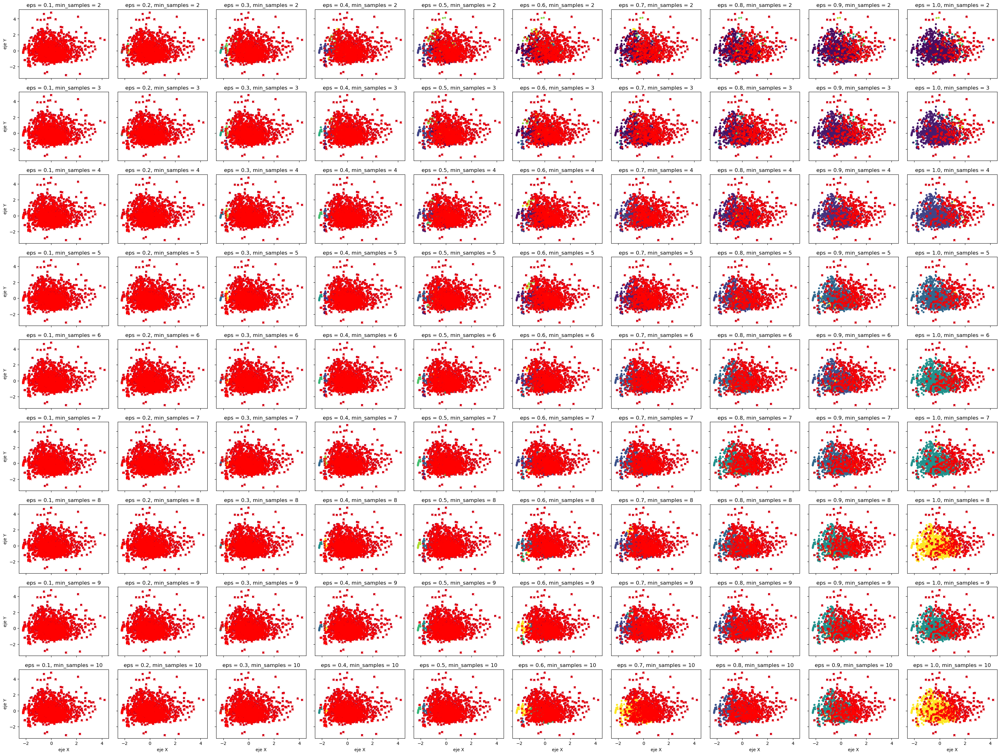

In [76]:
# Dataframe escalado con StandarScaler
scaler = StandardScaler()
# Escalamos el dataframe con StandarScaler
df_diario_escalado_2 = pd.DataFrame(scaler.fit_transform(df_diario), columns=df_diario.columns)
resultados_2 = combinaciones(df_diario_escalado_2)
print(resultados_2)

### Imputación de outliers

In [77]:
combinaciones_con_outliers = combinaciones_con_outliers(df_diario_escalado_1)

print("Combinaciones con outliers (eps, min_samples,outliers:")
print(combinaciones_con_outliers)

Combinaciones con outliers (eps, min_samples,outliers:
[(0.1, 2, 378), (0.2, 2, 33), (0.3, 2, 5), (0.4, 2, 1), (0.1, 3, 430), (0.2, 3, 49), (0.1, 4, 509), (0.2, 4, 54), (0.3, 4, 6), (0.1, 5, 565), (0.2, 5, 70), (0.3, 5, 10), (0.1, 6, 627), (0.2, 6, 79), (0.1, 7, 656), (0.2, 7, 87), (0.3, 7, 11), (0.1, 8, 686), (0.2, 8, 93), (0.1, 9, 716), (0.2, 9, 97), (0.3, 9, 13), (0.1, 10, 749), (0.2, 10, 104), (0.4, 10, 2)]


In [78]:
df_diario.describe().iloc[1:3,:]

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1557.353165,177.920024,346759.938685,6601.766410,1595.325035,1842.023492,9261.313114
std,586.784036,50.141920,3170.949710,2425.920789,1586.805565,2078.742054,3776.732029


In [79]:
for eps, num_samples,num_outliers in sorted(combinaciones_con_outliers, key=lambda x: x[2]):
    print(f"Interpolación para eps = {eps}, num_samples = {num_samples}, outliers = {num_outliers}:")
    interpolated_data = interpolate_outliers(df_diario, eps=eps, min_samples=num_samples, method='time')
    display(interpolated_data.describe().iloc[1:3,:])
    display(((abs(-interpolated_data.describe().iloc[1:3,:]+df_diario.describe().iloc[1:3,:])/df_diario.describe().iloc[1:3,:])*100).applymap(lambda x: "{:.2f}%".format(x)))
    print("-" * 50)

Interpolación para eps = 0.4, num_samples = 2, outliers = 1:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1557.313236,177.916729,346791.021883,6601.587027,1595.32223,1842.052244,9257.865007
std,586.790689,50.145828,2956.467258,2425.955550,1586.80648,2078.722171,3778.311442


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.00%,0.00%,0.01%,0.00%,0.00%,0.00%,0.04%
std,0.00%,0.01%,6.76%,0.00%,0.00%,0.00%,0.04%


--------------------------------------------------
Interpolación para eps = 0.4, num_samples = 10, outliers = 2:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1556.219580,177.842151,346792.148394,6596.992707,1590.356942,1837.082398,9255.801893
std,585.299723,50.105976,2956.034042,2419.447678,1579.072382,2066.662669,3779.603970


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.07%,0.04%,0.01%,0.07%,0.31%,0.27%,0.06%
std,0.25%,0.07%,6.78%,0.27%,0.49%,0.58%,0.08%


--------------------------------------------------
Interpolación para eps = 0.3, num_samples = 2, outliers = 5:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1554.608399,177.685677,346792.972745,6590.190603,1576.045933,1843.767532,9249.657433
std,581.808081,49.722869,2956.641874,2404.487034,1541.231063,2077.570353,3769.783265


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.18%,0.13%,0.01%,0.18%,1.21%,0.09%,0.13%
std,0.85%,0.84%,6.76%,0.88%,2.87%,0.06%,0.18%


--------------------------------------------------
Interpolación para eps = 0.3, num_samples = 4, outliers = 6:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1553.958570,177.720832,346795.768152,6587.457265,1575.937588,1843.867812,9246.578009
std,580.834734,49.637400,2952.818979,2400.434109,1541.280955,2077.493488,3763.194573


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.22%,0.11%,0.01%,0.22%,1.22%,0.10%,0.16%
std,1.01%,1.01%,6.88%,1.05%,2.87%,0.06%,0.36%


--------------------------------------------------
Interpolación para eps = 0.3, num_samples = 5, outliers = 10:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1550.980550,177.551509,346799.560859,6574.647798,1560.313815,1827.340112,9242.684601
std,575.646123,49.591506,2950.937767,2377.145721,1511.011273,2039.698111,3764.930859


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.41%,0.21%,0.01%,0.41%,2.19%,0.80%,0.20%
std,1.90%,1.10%,6.94%,2.01%,4.78%,1.88%,0.31%


--------------------------------------------------
Interpolación para eps = 0.3, num_samples = 7, outliers = 11:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1550.681833,177.512396,346799.308653,6573.285175,1555.909888,1826.801893,9242.486845
std,575.518454,49.521551,2950.920209,2376.439212,1492.718781,2039.951015,3764.781609


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.43%,0.23%,0.01%,0.43%,2.47%,0.83%,0.20%
std,1.92%,1.24%,6.94%,2.04%,5.93%,1.87%,0.32%


--------------------------------------------------
Interpolación para eps = 0.3, num_samples = 9, outliers = 13:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1549.178770,177.441550,346801.596093,6566.826935,1550.721248,1812.058205,9237.818542
std,574.840016,49.466897,2949.405836,2373.338700,1487.988235,2009.046052,3765.609197


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,0.52%,0.27%,0.01%,0.53%,2.80%,1.63%,0.25%
std,2.04%,1.35%,6.99%,2.17%,6.23%,3.35%,0.29%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 2, outliers = 33:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1538.259373,176.609499,346817.474806,6520.795056,1526.620617,1762.278035,9230.058769
std,556.192021,48.531112,2942.625135,2294.788227,1447.206165,1962.996852,3704.828697


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1.23%,0.74%,0.02%,1.23%,4.31%,4.33%,0.34%
std,5.21%,3.21%,7.20%,5.41%,8.80%,5.57%,1.90%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 3, outliers = 49:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1525.296752,176.090527,346828.641934,6465.835765,1495.744390,1711.299073,9202.856805
std,537.029413,48.174147,2943.669350,2213.501841,1386.319507,1876.013925,3688.192550


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,2.06%,1.03%,0.02%,2.06%,6.24%,7.10%,0.63%
std,8.48%,3.92%,7.17%,8.76%,12.63%,9.75%,2.34%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 4, outliers = 54:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1520.823578,175.814938,346832.990942,6446.890253,1485.626578,1703.590448,9193.371882
std,528.982892,47.975147,2942.609312,2179.027044,1375.646568,1866.433458,3678.578765


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,2.35%,1.18%,0.02%,2.35%,6.88%,7.52%,0.73%
std,9.85%,4.32%,7.20%,10.18%,13.31%,10.21%,2.60%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 5, outliers = 70:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1512.248952,174.993999,346842.012713,6410.385765,1447.600281,1673.606226,9140.093832
std,520.828101,46.991537,2947.881164,2143.955599,1312.815310,1834.529293,3619.069379


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,2.90%,1.64%,0.02%,2.90%,9.26%,9.14%,1.31%
std,11.24%,6.28%,7.03%,11.62%,17.27%,11.75%,4.17%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 6, outliers = 79:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1507.268028,174.912511,346848.649112,6389.790232,1439.701290,1681.243731,9128.781241
std,515.658527,46.865846,2949.655968,2122.344026,1294.675952,1832.438046,3604.002799


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,3.22%,1.69%,0.03%,3.21%,9.75%,8.73%,1.43%
std,12.12%,6.53%,6.98%,12.51%,18.41%,11.85%,4.57%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 7, outliers = 87:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1502.235816,174.643234,346856.082326,6368.423004,1429.677430,1652.921626,9114.667206
std,510.963418,46.694798,2949.053542,2102.113717,1283.527776,1790.637100,3596.157188


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,3.54%,1.84%,0.03%,3.53%,10.38%,10.27%,1.58%
std,12.92%,6.87%,7.00%,13.35%,19.11%,13.86%,4.78%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 8, outliers = 93:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1499.527939,174.382816,346858.164856,6356.908057,1426.522343,1634.488292,9104.115978
std,508.449233,46.137408,2950.975655,2092.099224,1283.006383,1763.974108,3580.486539


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,3.71%,1.99%,0.03%,3.71%,10.58%,11.27%,1.70%
std,13.35%,7.99%,6.94%,13.76%,19.15%,15.14%,5.20%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 9, outliers = 97:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1498.455078,174.250391,346857.824740,6352.181881,1423.479536,1621.081275,9106.365802
std,508.301371,45.895383,2951.137689,2091.148242,1282.575439,1737.835584,3583.036258


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,3.78%,2.06%,0.03%,3.78%,10.77%,11.99%,1.67%
std,13.38%,8.47%,6.93%,13.80%,19.17%,16.40%,5.13%


--------------------------------------------------
Interpolación para eps = 0.2, num_samples = 10, outliers = 104:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1496.122788,174.053283,346856.665432,6342.035285,1414.117080,1596.150047,9109.827206
std,506.792581,45.722581,2952.080388,2083.796441,1270.200818,1703.222226,3584.362686


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,3.93%,2.17%,0.03%,3.93%,11.36%,13.35%,1.64%
std,13.63%,8.81%,6.90%,14.10%,19.95%,18.06%,5.09%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 2, outliers = 378:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1431.056539,169.815765,346920.066159,6066.427747,1274.199123,1248.012485,8946.479806
std,452.113320,42.962648,2875.824710,1852.218389,1049.343703,1325.778374,3329.592067


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,8.11%,4.56%,0.05%,8.11%,20.13%,32.25%,3.40%
std,22.95%,14.32%,9.31%,23.65%,33.87%,36.22%,11.84%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 3, outliers = 430:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1411.465128,167.845324,346942.253177,5983.353816,1200.771404,1139.641855,8927.972262
std,445.496586,40.404026,2878.599719,1821.339591,948.493758,1184.680510,3294.839268


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,9.37%,5.66%,0.05%,9.37%,24.73%,38.13%,3.60%
std,24.08%,19.42%,9.22%,24.92%,40.23%,43.01%,12.76%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 4, outliers = 509:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1389.576752,166.054706,346977.361542,5889.807676,1110.428947,1018.905714,8873.993315
std,422.986851,40.208728,2829.671860,1726.060686,834.734032,1047.621560,3171.744838


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,10.77%,6.67%,0.06%,10.78%,30.39%,44.69%,4.18%
std,27.91%,19.81%,10.76%,28.85%,47.40%,49.60%,16.02%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 5, outliers = 565:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1375.912990,165.539851,347054.502095,5831.115115,1063.426842,897.649223,8896.228754
std,413.852837,40.227684,2744.429280,1687.793734,797.229178,907.857735,3088.111831


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,11.65%,6.96%,0.08%,11.67%,33.34%,51.27%,3.94%
std,29.47%,19.77%,13.45%,30.43%,49.76%,56.33%,18.23%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 6, outliers = 627:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1362.614331,164.474642,347064.462072,5775.055992,1002.392807,824.290276,8882.836473
std,408.523953,39.773704,2798.677734,1664.903330,719.490123,810.018086,3041.282525


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,12.50%,7.56%,0.09%,12.52%,37.17%,55.25%,4.09%
std,30.38%,20.68%,11.74%,31.37%,54.66%,61.03%,19.47%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 7, outliers = 656:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1352.296782,163.624557,347085.743655,5730.684202,989.140175,773.094837,8839.630157
std,402.947134,39.374149,2779.102642,1640.360895,704.558867,738.141355,3026.081775


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,13.17%,8.03%,0.09%,13.19%,38.00%,58.03%,4.55%
std,31.33%,21.47%,12.36%,32.38%,55.60%,64.49%,19.88%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 8, outliers = 686:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1337.541865,162.866213,347104.505413,5668.479500,970.160175,704.260802,8783.810859
std,391.138486,39.064626,2774.413106,1589.386326,691.565548,630.562376,2999.751974


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,14.11%,8.46%,0.10%,14.14%,39.19%,61.77%,5.16%
std,33.34%,22.09%,12.51%,34.48%,56.42%,69.67%,20.57%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 9, outliers = 716:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1332.506609,162.376164,347148.361446,5646.381849,933.595263,690.458734,8707.087158
std,392.156983,37.694302,2687.260230,1591.934985,672.378121,617.361146,2994.572185


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,14.44%,8.74%,0.11%,14.47%,41.48%,62.52%,5.98%
std,33.17%,24.82%,15.25%,34.38%,57.63%,70.30%,20.71%


--------------------------------------------------
Interpolación para eps = 0.1, num_samples = 10, outliers = 749:


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,1324.955205,162.187004,347228.881776,5614.066937,902.743684,632.741190,8685.216456
std,392.006472,37.281872,2551.280598,1588.151468,643.450976,526.149358,3001.865127


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
mean,14.92%,8.84%,0.14%,14.96%,43.41%,65.65%,6.22%
std,33.19%,25.65%,19.54%,34.53%,59.45%,74.69%,20.52%


--------------------------------------------------


In [80]:
df_diario_i = interpolate_outliers(df_diario, eps=0.2, min_samples=2, method='time')
df_diario_i

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
dt,,,,,,,
2007-01-01,2749.004,148.166,345785.730,11400.4,0.0,352.0,5880.0
2007-01-02,1269.236,190.342,348399.040,5348.2,0.0,348.0,6562.0
2007-01-03,1014.054,196.728,350722.210,4340.2,0.0,344.0,4765.0
2007-01-04,1863.709,184.941,348518.055,7847.4,741.5,361.5,6183.5
2007-01-05,2713.364,173.154,346313.900,11354.6,1483.0,379.0,7602.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536,142.354,345883.850,8660.4,4855.0,2110.0,10136.0
2010-11-23,1577.536,137.450,346428.760,6731.2,1871.0,458.0,7611.0
2010-11-24,1796.248,132.460,345644.590,7559.4,1096.0,2848.0,12224.0


## Test de hipótesis

In [81]:
year_min = 2007
year_max = 2010

for year in range(year_min, year_max + 1):
    # Filtrar los datos para el año actual
    df_year = df[(df.index.year == year)]
    
    # Crear 12 grupos, uno por cada mes del año
    grupos_por_mes = df_year.groupby(df_year.index.month)
    
    # Realizar el ANOVA de una vía para cada grupo (mes)
    resultado_anova = grupos_por_mes.apply(lambda x: stats.f_oneway(*[group['Voltage'] for _, group in x.groupby(x.index)]))
    
    # Obtener los valores p del ANOVA para cada grupo (mes)
    p_valores_anova = resultado_anova.apply(lambda x: x.pvalue)
    
    # Comparar los valores p con el nivel de significancia alfa
    print('Para el año', year)
    alfa = 0.05
    if (p_valores_anova < alfa).any():
        print("Hay diferencias significativas entre al menos dos grupos.")
    else:
        print("No se encontraron diferencias significativas entre los grupos.")

Para el año 2007
No se encontraron diferencias significativas entre los grupos.
Para el año 2008
No se encontraron diferencias significativas entre los grupos.
Para el año 2009
No se encontraron diferencias significativas entre los grupos.
Para el año 2010
No se encontraron diferencias significativas entre los grupos.


In [82]:
#Análisis de normalidad
shapiro_test(df,0.05)

Podemos concluir que la variable Global_active_power no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Global_reactive_power no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Voltage no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Global_intensity no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Sub_metering_1 no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Sub_metering_2 no se distribuye normalmente con un  95 % de confianza
Podemos concluir que la variable Sub_metering_3 no se distribuye normalmente con un  95 % de confianza


In [83]:
#Análisis de independencia
test_independencia(df,0.05)


Columnas: Global_active_power y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.

Columnas: Global_reactive_power y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.

Columnas: Voltage y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.

Columnas: Global_intensity y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.

Columnas: Sub_metering_1 y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.

Columnas: Sub_metering_2 y Sub_metering_3
Se rechaza la hipótesis nula. Existe evidencia de dependencia entre las variables.


 ## Análisis serie temporal

### Análisis 1: Serie temporal de la suma diaria de Global active power

Text(0.5, 1.0, 'Suma diaria Global active power')

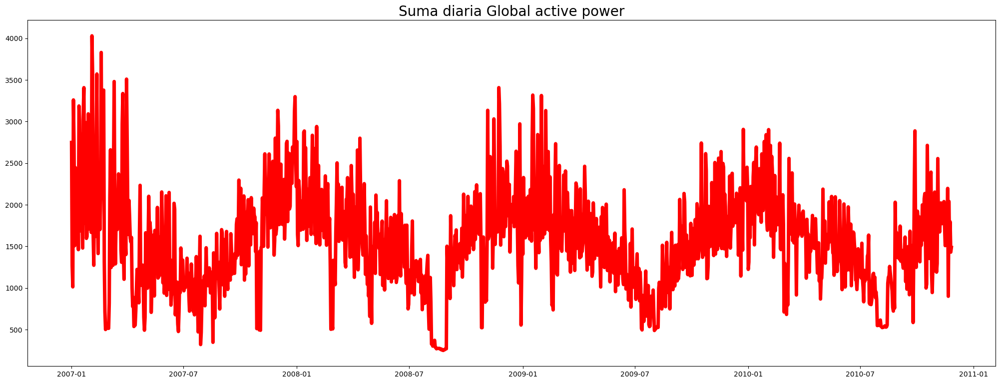

In [84]:
plt.figure(figsize = (25,9))
plt.plot(df.Global_active_power.resample('D').sum(),lw = 5,color = 'r')
plt.title('Suma diaria Global active power',fontsize = 20)

#### Componentes de una serie de tiempo

In [85]:
ete = seasonal_decompose(df.Global_active_power.resample('D').sum()[(df.Global_active_power.resample('D').sum().index.year == 2007)], model = 'additive')

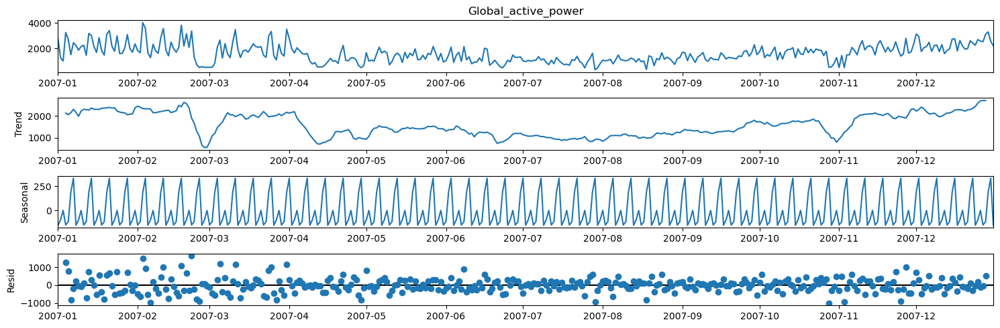

In [86]:
plt.rcParams["figure.figsize"] = (15,5)
graf = ete.plot()


In [87]:
ete_1 = seasonal_decompose(df.Global_active_power.resample('D').sum()[(df.Global_active_power.resample('D').sum().index.year == 2007) & (df.Global_active_power.resample('D').sum().index.month == 1)] , model = 'additive')

#### Estacionalidad

<Axes: xlabel='dt'>

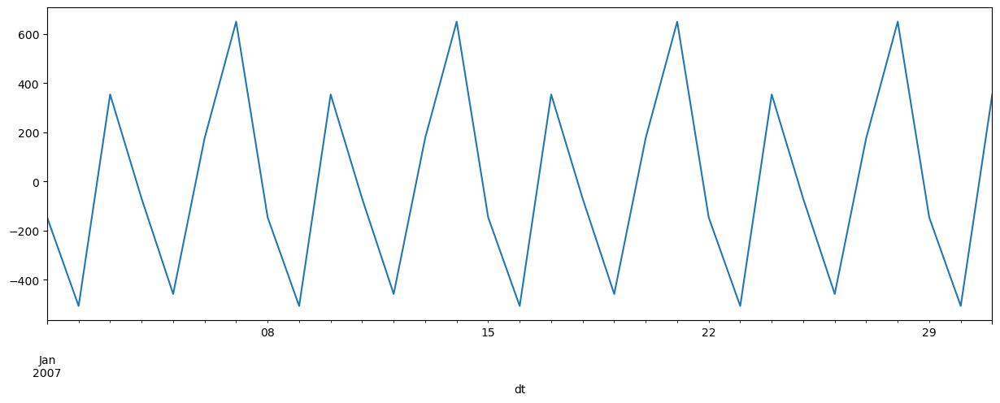

In [88]:
plt.rcParams["figure.figsize"] = (15,5)
ete_1.seasonal.plot()

Identificamos un patron semanal, y como nuestros datos son diarios la periodicidad es de m = 7.

Verificaremos si la serie es estacionaria usando la **prueba Augmented Dickey Fuller**, del paquete statsmodels.adfuller().
La hipótesis nula de la prueba ADF es que la serie de tiempo no es estacionaria. Entonces si el $p-valor$ de la prueba es menor que el nivel de significancia, entonces rechaza la hipótesis nula y se infiere que la serie de tiempo es estacionaria.
En el caso de que la serie no sea estacionaria, tendriamos que diferenciar la serie temporal para buscar el valor de $d$. Caso contrario $d = 0$.

In [89]:
Augmented_Dickey_Fuller(df.Global_active_power.resample('D').sum())

ADF Statistic: -3.768512
p-value: 0.003246
Se rechaza la hipótesis nula, por lo tanto la serie temporal es estacionaria con un 0.05 nivel de significancia


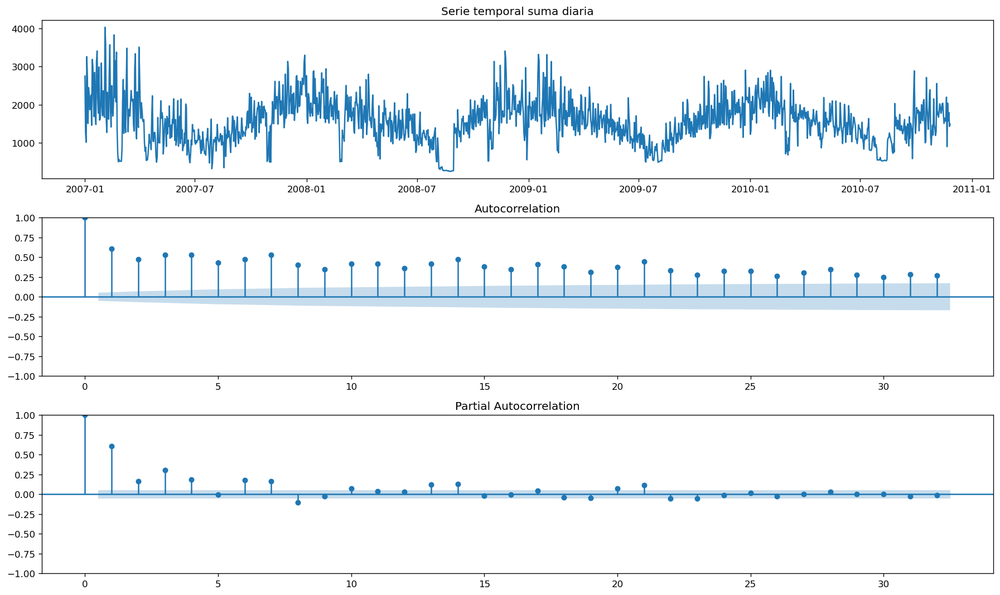

In [90]:
plt.rcParams.update({'figure.figsize':(15,9), 'figure.dpi':120})

fig, axes = plt.subplots(3,1,sharex = False)
axes[0].plot(df.Global_active_power.resample('D').sum()); axes[0].set_title('Serie temporal suma diaria')
plot_acf(df.Global_active_power.resample('D').sum(), ax = axes[1])
plot_pacf(df.Global_active_power.resample('D').sum(), ax = axes[2])
fig.tight_layout()
plt.show()

Notamos que hay cierto decaimiento exponencial en el $ ACF $, por lo que se cumple el primer supuesto para utilizar un modelo $Ar(p)$.
Podemos observar que hasta el retraso $k = 4$ los valores son significativos (consecutivamente)con un $0.05$ de significancia (por defecto). Por lo que un $p = 4$ podría ser lo más adecuado para nuestro modelo $AR(p)$.
Para elegir el parámetro del modelo $MA(q)$, notamos que todos los valores del $ACF$ son significativamente distintos de cero, por lo que esta serie de tiempo no presenta estructura de medias móviles. 

### División datos de entrenamiento y testeo.

In [91]:
df_test = df_diario_i.Global_active_power[(df_diario_i.Global_active_power.index.year == 2010)]
df_train = df_diario_i.Global_active_power[~(df_diario_i.Global_active_power.index.year == 2010)]

In [92]:
std_scaler = StandardScaler()
min_scaler=MinMaxScaler()
df_test = min_scaler.fit_transform(df_test.values.reshape(-1,1))
df_train = min_scaler.fit_transform(df_train.values.reshape(-1,1))

In [93]:
df_train

array([[0.74685397],
       [0.30455679],
       [0.22828384],
       ...,
       [0.5373169 ],
       [0.65781455],
       [0.58631318]])

In [94]:
df_test = pd.DataFrame({'Global_active_power': list(df_test)}, index=df_diario_i.index[(df_diario_i.Global_active_power.index.year == 2010)])
df_test.head()

,Global_active_power
dt,
2010-01-01,[0.3017736979838497]
2010-01-02,[0.33954922859625314]
2010-01-03,[0.6724418049838179]
2010-01-04,[0.46565762805750865]
2010-01-05,[0.731254168496563]


#### Modelo 1: AR(4)

In [95]:
model_1 = ARIMA(df.Global_active_power.resample('D').sum(),order = (4,0,0))
model_fit1 = model_1.fit()
print(model_fit1.summary())

                                SARIMAX Results                                
Dep. Variable:     Global_active_power   No. Observations:                 1426
Model:                  ARIMA(4, 0, 0)   Log Likelihood              -10670.587
Date:                 Thu, 01 Feb 2024   AIC                          21353.174
Time:                         20:53:25   BIC                          21384.750
Sample:                     01-01-2007   HQIC                         21364.967
                          - 11-26-2010                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1557.3532     67.279     23.148      0.000    1425.489    1689.218
ar.L1          0.4059      0.021     19.024      0.000       0.364       0.448
ar.L2          0.0050      0.024      0.212 

In [96]:
sm.stats.acorr_ljungbox(model_fit1.resid, lags = [10], return_df = True)

,lb_stat,lb_pvalue
10,100.326773,4.687753e-17


#### Modelo 2: AR(3)

In [97]:
model_2 = ARIMA(df.Global_active_power.resample('D').sum(),order = (3,0,0))
model_fit2 = model_2.fit()
print(model_fit2.summary())

                                SARIMAX Results                                
Dep. Variable:     Global_active_power   No. Observations:                 1426
Model:                  ARIMA(3, 0, 0)   Log Likelihood              -10695.263
Date:                 Thu, 01 Feb 2024   AIC                          21400.526
Time:                         20:53:26   BIC                          21426.839
Sample:                     01-01-2007   HQIC                         21410.354
                          - 11-26-2010                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1557.3532     56.798     27.419      0.000    1446.032    1668.674
ar.L1          0.4607      0.021     22.156      0.000       0.420       0.501
ar.L2          0.0076      0.024      0.311 

In [98]:
sm.stats.acorr_ljungbox(model_fit2.resid, lags = [10], return_df = True)

,lb_stat,lb_pvalue
10,120.104427,4.819072e-21


#### Modelo 3: AR(2)

In [99]:
model_3 = ARIMA(df.Global_active_power.resample('D').sum(),order = (2,0,0))
model_fit3 = model_3.fit()
print(model_fit3.summary())

                                SARIMAX Results                                
Dep. Variable:     Global_active_power   No. Observations:                 1426
Model:                  ARIMA(2, 0, 0)   Log Likelihood              -10763.560
Date:                 Thu, 01 Feb 2024   AIC                          21535.120
Time:                         20:53:26   BIC                          21556.170
Sample:                     01-01-2007   HQIC                         21542.982
                          - 11-26-2010                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1557.3533     42.531     36.617      0.000    1473.995    1640.712
ar.L1          0.5106      0.023     22.473      0.000       0.466       0.555
ar.L2          0.1624      0.023      6.960 

In [100]:
sm.stats.acorr_ljungbox(model_fit3.resid, lags = [10], return_df = True)

,lb_stat,lb_pvalue
10,329.266036,9.937127e-65


#### Modelo 4: AR(1)

In [101]:
model_4 = ARIMA(df.Global_active_power.resample('D').sum(),order = (1,0,0))
model_fit4 = model_4.fit()
print(model_fit4.summary())

                                SARIMAX Results                                
Dep. Variable:     Global_active_power   No. Observations:                 1426
Model:                  ARIMA(1, 0, 0)   Log Likelihood              -10782.516
Date:                 Thu, 01 Feb 2024   AIC                          21571.032
Time:                         20:53:27   BIC                          21586.820
Sample:                     01-01-2007   HQIC                         21576.929
                          - 11-26-2010                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1557.3532     35.756     43.555      0.000    1487.273    1627.433
ar.L1          0.6098      0.019     31.303      0.000       0.572       0.648
sigma2      2.159e+05   6762.741     31.918 

In [102]:
sm.stats.acorr_ljungbox(model_fit4.resid, lags = [10], return_df = True)

,lb_stat,lb_pvalue
10,338.083434,1.343435e-66


In [103]:
model_auto = pm.auto_arima(df_diario_i.Global_active_power, start_p = 1,start_q = 1,
                           test = 'adf', #Usar adftest para burcar el "d" optimo
                          max_p = 4, max_q = 4,
                          m=1, #frecuencia de la serie
                          d = None, #Dejar que el modelo determine "d"
                          seasonal = False, #No estacionalidad
                          star_P = 0,
                          D=0,
                          trace = True,
                          error_traction = 'ignore',
                          sppress_warnings = True,
                          stepwise = True)
print(model_auto.summary())

Performing stepwise search to minimize aic


 ARIMA(1,0,1)(0,0,0)[0]             : AIC=21178.320, Time=0.51 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=25153.042, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=21608.021, Time=0.10 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=23779.793, Time=0.26 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=21139.301, Time=1.01 sec
 ARIMA(2,0,0)(0,0,0)[0]             : AIC=21465.986, Time=0.22 sec
 ARIMA(3,0,1)(0,0,0)[0]             : AIC=21121.546, Time=1.20 sec
 ARIMA(3,0,0)(0,0,0)[0]             : AIC=inf, Time=0.35 sec
 ARIMA(4,0,1)(0,0,0)[0]             : AIC=21103.444, Time=1.07 sec
 ARIMA(4,0,0)(0,0,0)[0]             : AIC=inf, Time=0.14 sec
 ARIMA(4,0,2)(0,0,0)[0]             : AIC=21103.270, Time=1.05 sec
 ARIMA(3,0,2)(0,0,0)[0]             : AIC=21117.913, Time=0.87 sec
 ARIMA(4,0,3)(0,0,0)[0]             : AIC=20994.659, Time=1.13 sec
 ARIMA(3,0,3)(0,0,0)[0]             : AIC=21049.581, Time=1.04 sec
 ARIMA(4,0,4)(0,0,0)[0]             : AIC=20994.665, Time=1.64 sec
 ARIMA(

In [104]:
model = ARIMA(df_diario_i.Global_active_power,order = (4,0,3))
model_fit = model.fit()
print(model_fit.summary())

                                SARIMAX Results                                
Dep. Variable:     Global_active_power   No. Observations:                 1426
Model:                  ARIMA(4, 0, 3)   Log Likelihood              -10485.741
Date:                 Thu, 01 Feb 2024   AIC                          20989.482
Time:                         20:53:44   BIC                          21036.846
Sample:                     01-01-2007   HQIC                         21007.172
                          - 11-26-2010                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1538.2598    587.697      2.617      0.009     386.395    2690.125
ar.L1          0.8664      0.030     28.722      0.000       0.807       0.926
ar.L2         -0.7191      0.018    -41.027 

Maximum Likelihood optimization failed to converge. Check mle_retvals


In [105]:
sm.stats.acorr_ljungbox(model_fit.resid, lags = [10], return_df = True)

,lb_stat,lb_pvalue
10,20.234406,0.027112


#### Modelo SARIMA

In [106]:
model_auto_estacional = pm.auto_arima(df_diario_i.Global_active_power, start_p = 1,start_q = 1,
                           test = 'adf', #Usar adftest para burcar el "d" optimo
                          max_p = 4, max_q = 4,
                          m=7, #frecuencia de la serie
                          d = None, #Dejar que el modelo determine "d"
                          seasonal = True, #Estacionalidad
                          star_P = 0,
                          D=0,
                          trace = True,
                          error_traction = 'ignore',
                          sppress_warnings = True,
                          stepwise = True)
print(model_auto_estacional.summary())

Performing stepwise search to minimize aic


 ARIMA(1,0,1)(1,0,1)[7] intercept   : AIC=21155.375, Time=3.84 sec
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=22077.628, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=21209.669, Time=0.98 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=21411.116, Time=1.06 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=25153.042, Time=0.03 sec
 ARIMA(1,0,1)(0,0,1)[7] intercept   : AIC=21127.091, Time=2.46 sec
 ARIMA(1,0,1)(0,0,0)[7] intercept   : AIC=21156.633, Time=1.35 sec
 ARIMA(1,0,1)(0,0,2)[7] intercept   : AIC=21106.135, Time=4.08 sec
 ARIMA(1,0,1)(1,0,2)[7] intercept   : AIC=21137.310, Time=5.96 sec
 ARIMA(0,0,1)(0,0,2)[7] intercept   : AIC=21340.790, Time=2.00 sec
 ARIMA(1,0,0)(0,0,2)[7] intercept   : AIC=21210.274, Time=2.77 sec
 ARIMA(2,0,1)(0,0,2)[7] intercept   : AIC=21135.244, Time=1.18 sec
 ARIMA(1,0,2)(0,0,2)[7] intercept   : AIC=21066.472, Time=5.14 sec
 ARIMA(1,0,2)(0,0,1)[7] intercept   : AIC=21141.209, Time=0.61 sec
 ARIMA(1,0,2)(1,0,2)[7] intercept   : AIC=21141.856, Time=3.93

In [107]:
model_auto_estacional = sm.tsa.SARIMAX(df_train,order = (1,0,2), seasonal_order = (0,0,2,7))
result = model_auto_estacional.fit()
print(result.summary())

                                     SARIMAX Results                                     
Dep. Variable:                                 y   No. Observations:                 1096
Model:             SARIMAX(1, 0, 2)x(0, 0, 2, 7)   Log Likelihood                 762.498
Date:                           Thu, 01 Feb 2024   AIC                          -1512.996
Time:                                   20:54:35   BIC                          -1482.999
Sample:                                        0   HQIC                         -1501.646
                                          - 1096                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9964      0.002    659.132      0.000       0.993       0.999
ma.L1         -0.5609      0.024    -23.157

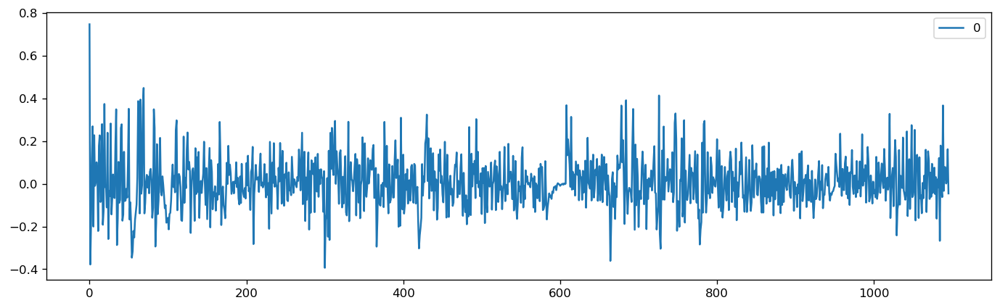

In [108]:
residuals = pd.DataFrame(result.resid)
residuals.plot(figsize = (14,4))
plt.show;

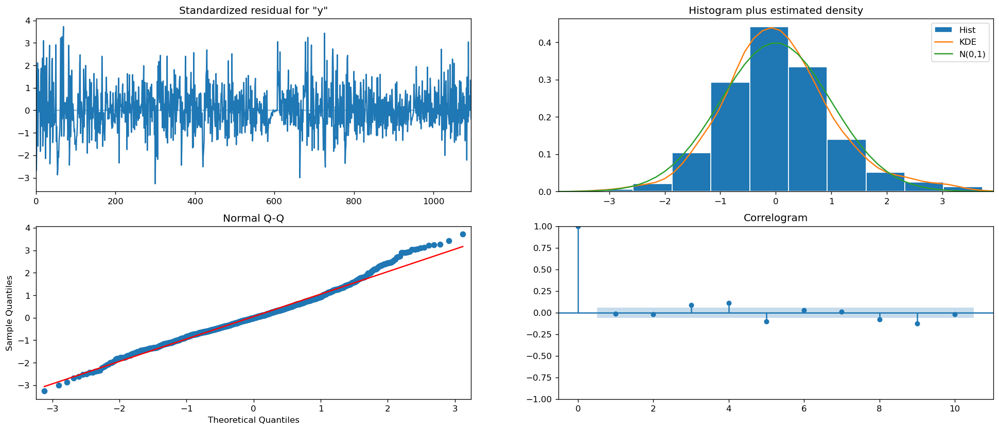

In [109]:
result.plot_diagnostics(figsize = (20,8))
plt.show()

Se puede ver vizualmente que los errores fluctuan alrededor de una media cero y varianza semi-constante. 
Vemos que la gráfica de densidad estimada sigue una distribución normal alrededor del cero.
En una gráfica QQ, el eje x muestra los cuantiles teóricos . Esto significa que no muestra sus datos reales, sino que representa dónde estarían sus datos si se distribuyeran normalmente.
El eje y muestra sus datos reales . Esto significa que si los valores de los datos caen a lo largo de una línea aproximadamente recta en un ángulo de 45 grados, entonces los datos se distribuyen normalmente.
En el gráfico ACF se muestra que lo errores no estan correlacionados.
